In [1]:
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import matplotlib as mpl
import numpy as np
import pandas as pd
from functions import *
from string import ascii_lowercase
from joblib import Parallel, delayed
from pyunicorn.timeseries import RecurrencePlot as RP
from numba import njit
from scipy.interpolate import interp1d

## Phase space

In [5]:
ks = [0.0, 0.9, 1.5, 3.63, 5.3, 9.0]
n_ic = 100
N = 15000
x_ini = -np.pi
x_end = np.pi
y_ini = -np.pi
y_end = np.pi

<Figure size 640x480 with 0 Axes>

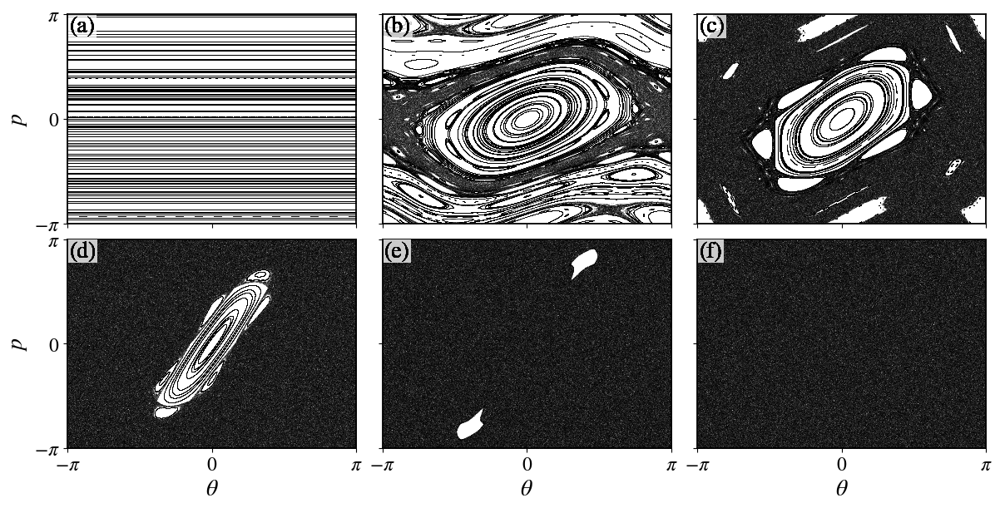

In [6]:
plot_params()
fig, ax = plt.subplots(2, 3, sharex=True, sharey=True, figsize=(12, 6))
xbox = 0.007
ybox = 0.916
bbox = {'linewidth': 0.0, 'facecolor': 'white', 'alpha': 0.02, 'pad': 1}
for i, k in enumerate(ks):
    np.random.seed(131313)
    for j in range(n_ic):
        x0 = (x_end - x_ini)*np.random.rand()
        y0 = (y_end - y_ini)*np.random.rand()
        ts = time_series_stdmap(x0, y0, k, N)
        ax[int(i / 3), i % 3].plot(ts[:, 0], ts[:, 1], "ko", markersize=0.2, markeredgewidth=0)
        ax[int(i / 3), i % 3].text(xbox, ybox, "(%s)" % (ascii_lowercase[i]), transform=ax[int(i / 3), i % 3].transAxes, bbox=bbox)

ax[0,0].set_xlim(x_ini, x_end), ax[0,0].set_ylim(y_ini, y_end);
ax[0, 0].set_ylabel("$p$"), ax[1, 0].set_ylabel("$p$")
ax[1, 0].set_xlabel("$\\theta$"), ax[1, 1].set_xlabel("$\\theta$"), ax[1, 2].set_xlabel("$\\theta$")
ax[0, 0].set_xticks([-np.pi, 0, np.pi]), ax[0, 0].set_yticks([-np.pi, 0, np.pi])
ax[0, 0].set_xticklabels(["$-\\pi$", "$0$", "$\\pi$"]), ax[0, 0].set_yticklabels(["$-\\pi$", "$0$", "$\\pi$"]);
plt.subplots_adjust(left=0.06, right=0.98, top=0.98, hspace=0.075, wspace=0.09)
plt.savefig("Figures/stdmap_phase_space.png", dpi=300)

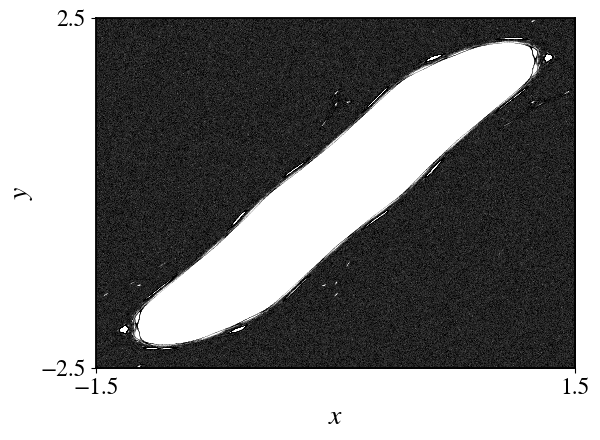

In [21]:
k = 4.0
n_ic = 300
N = int(2e7)
x_ini = -1.5
x_end = 1.5
y_ini = -2.5
y_end = 2.5

plot_params()
"""np.random.seed(11313)
for j in range(n_ic):
    x0 = (x_end - x_ini)*np.random.rand()
    y0 = (y_end - y_ini)*np.random.rand()
    ts = time_series_stdmap(x0, y0, k, N)
    plt.plot(ts[:, 0], ts[:, 1], "ko", markersize=0.2, markeredgewidth=0)"""
x0 = -1.5
y0 = 0
ts = time_series_stdmap(x0, y0, k, N)
plt.plot(ts[:, 0], ts[:, 1], "ko", markersize=0.1, markeredgewidth=0)
plt.xlim(x_ini, x_end)
plt.ylim(y_ini, y_end)
plt.xticks([x_ini, x_end])
plt.yticks([y_ini, y_end])
plt.xlabel("$x$")
plt.ylabel("$y$")
plt.tight_layout()
plt.savefig("Figures/stdmap_phase_space_k=4.0.png", dpi=300, bbox_inches='tight', pad_inches=0)

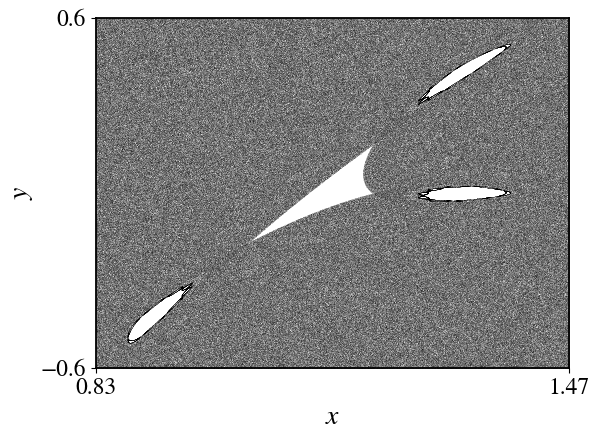

In [2]:
k = 6.908745
n_ic = 300
N = int(1e8)
x_ini = 0.83
x_end = 1.47
y_ini = -0.6
y_end = 0.6

plot_params()
"""np.random.seed(11313)
for j in range(n_ic):
    x0 = (x_end - x_ini)*np.random.rand()
    y0 = (y_end - y_ini)*np.random.rand()
    ts = time_series_stdmap(x0, y0, k, N)
    plt.plot(ts[:, 0], ts[:, 1], "ko", markersize=0.2, markeredgewidth=0)"""
x0 = 1.2655
y0 = 0
ts = time_series_stdmap(x0, y0, k, N)
plt.plot(ts[:, 0], ts[:, 1], "ko", markersize=0.15, markeredgewidth=0)
plt.xlim(x_ini, x_end)
plt.ylim(y_ini, y_end)
plt.xticks([x_ini, x_end])
plt.yticks([y_ini, y_end])
plt.xlabel("$x$")
plt.ylabel("$y$")
plt.tight_layout()
plt.savefig("Figures/stdmap_phase_space_k=6.908745.png", dpi=300, bbox_inches='tight', pad_inches=0)

## Lyapunov exponents time series

### LE for a single chaotic orbit to show $\lambda_1 + \lambda_2 = 0$

In [ ]:
k = 1.5
x0 = 3
y0 = 0
N = int(1e7)
exponent = int(np.log10(N))
base = int(N/10**exponent)
lypnv_vs_n = lyapunov_vs_n(x0, y0, k, N)

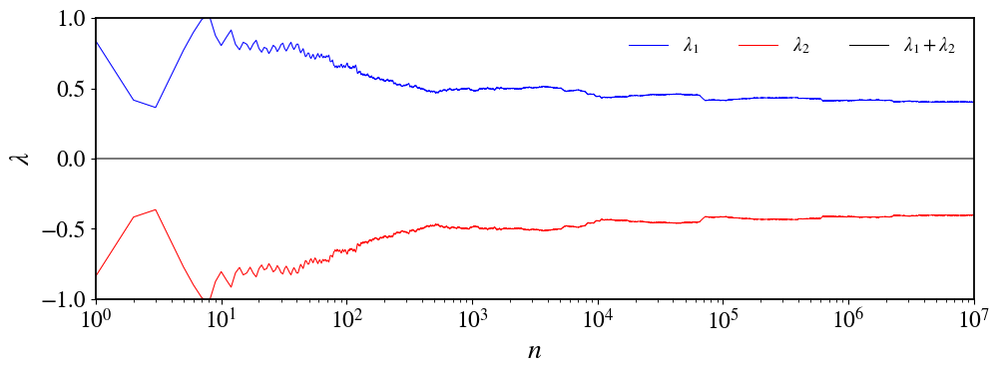

In [ ]:
fig, ax = plt.subplots(figsize=(10, 3.5))
lw = 0.75
plt.plot(lypnv_vs_n[:, 0], "b", lw=lw, label="$\\lambda_1$")
plt.plot(lypnv_vs_n[:, 1], "r", lw=lw, label="$\\lambda_2$")
plt.plot(lypnv_vs_n[:, 0] + lypnv_vs_n[:, 1], "k", lw=lw, label="$\\lambda_1 + \\lambda_2$")
plt.xlabel("$n$")
plt.ylabel("$\\lambda$")
plt.legend(loc="upper right", frameon=False, ncol=3)
plt.xlim(1, N)
plt.yticks([-1, -0.5, 0, 0.5, 1])
plt.ylim(-1, 1)
plt.xscale("log")
plt.subplots_adjust(left=0.1, bottom=0.17, right=0.98, top=0.975)
plt.savefig("Figures/stdmap_lyapunov_vs_n_k=%.1f_N=%ie%i.png" % (k, base, exponent), dpi=500)

### LEs for different chaotic IC to show that the trappings affect the convergence rate

In [20]:
k = [0.9, 1.5]
x0 = [[3, np.pi, np.pi, np.pi], [3, 2.87, -np.pi, 3*np.pi/2]]
y0 = [[0, -np.pi/2 - 0.12, -2.55, np.pi/2 + 0.11], [0, 0, -2, -np.pi]]

colors = ["black", "red", "blue", "green"]
N = int(400000)

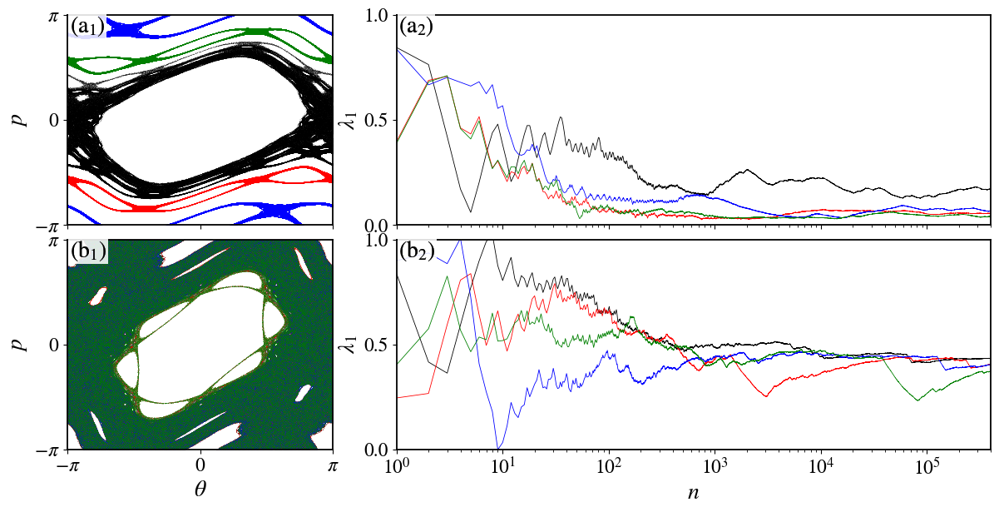

In [27]:
fig = plt.figure(constrained_layout=False, facecolor='w', figsize=(12,6))
gs = GridSpec(2, 3, figure=fig, left=0.055, bottom=0.11, right=0.98, top=0.98, wspace=0.24, hspace=0.07)
ax = [[plt.subplot(gs[0, 0:1]), plt.subplot(gs[0, 1:])], [plt.subplot(gs[1, 0]), plt.subplot(gs[1, 1:])]]
xbox = 0.008
xbox2 = 0.0035
ybox = 0.9155
bbox = {'linewidth': 0.0, 'facecolor': 'white', 'alpha': 0.4, 'pad': 1}
for i in range(len(k)):
    for j in range(len(x0[i])):
        ts = time_series_stdmap(x0[i][j], y0[i][j], k[i], N)
        ax[i][0].plot(ts[:, 0], ts[:, 1], "o", color=colors[j], markersize=0.25, markeredgewidth=0.0)
        ax[i][0].set_xlim(-np.pi, np.pi),ax[i][0].set_ylim(-np.pi, np.pi)
        ax[i][0].set_xticks([-np.pi, 0, np.pi]), ax[i][0].set_yticks([-np.pi, 0, np.pi])
        ax[i][0].set_yticklabels(["$-\\pi$", "$0$", "$\\pi$"])
        ax[i][0].set_ylabel("$p$")
        ax[i][0].text(xbox, ybox, "(%s$_{%i}$)" % (ascii_lowercase[i], 1), transform=ax[i][0].transAxes, bbox=bbox)

        lypnv_vs_n = lyapunov_vs_n(x0[i][j], y0[i][j], k[i], N)
        ax[i][1].plot(lypnv_vs_n[:, 0], color=colors[j], lw=0.6)
        ax[i][1].set_ylabel("$\\lambda_1$")
        ax[i][1].set_xscale("log")
        ax[i][1].set_xlim(1, N)
        ax[i][1].set_ylim(-0.0, 1.)
        ax[i][1].set_yticks([0, 0.5, 1])
        ax[i][1].text(xbox2, ybox, "(%s$_{%i}$)" % (ascii_lowercase[i], 2), transform=ax[i][1].transAxes, bbox=bbox)
        if i == 0:
            ax[i][0].set_xticklabels([])
            ax[i][1].set_xticklabels([])
        else:
            ax[i][0].set_xticklabels(["$-\\pi$", "$0$", "$\\pi$"])

ax[1][0].set_xlabel("$\\theta$")
ax[1][1].set_xlabel("$n$")

plt.savefig("Figures/stdmap_phase_space_AND_lyapunov_vs_n.png", dpi=300)

### LEs for regular orbits to show that the fixed point convergece rate is faster

In [28]:
k = 1.5
x0 = [3.0, 0.0, 0.25, 0.5, 0.75, 1.25]
y0 = [0.0, 0.0, 0., 0., 0., 0.]
N = 2000000 #int(1e5 + 1)

In [29]:
k = 1.5
Jac = np.array([[1 - k, 1], [-k, 1]])
Jacn = np.array([[1, 0], [0, 1]])
eigensv = np.zeros(N)
for i in range(N):
    Jacn = np.matmul(Jac, Jacn)
    eval, evec = np.linalg.eig(Jacn)
    eigensv[i] = np.max(eval)/(i + 1)

/tmp/ipykernel_19833/2100088823.py:8: ComplexWarning: Casting complex values to real discards the imaginary part
  eigensv[i] = np.max(eval)/(i + 1)


In [30]:
ts = Parallel(n_jobs=-1)(delayed(time_series_stdmap)(x0[j], y0[j], k, 2000000) for j in range(len(x0)))

In [31]:
lypnv_vs_n = Parallel(n_jobs=-1)(delayed(lyapunov_vs_n)(x0[j], y0[j], k, N) for j in range(len(x0)))

In [33]:
def fit_regular_lyap_decay(x, y, nmin=int(1e5), nmax=-1):
    l_fit = y[nmin:nmax]
    n_fit = x[nmin:nmax]
    l_fit_max = []
    n_fit_max = []
    for i in range(1, len(l_fit) - 1):
        if l_fit[i] > l_fit[i - 1] and l_fit[i] > l_fit[i + 1]:
            l_fit_max.append(l_fit[i])
            n_fit_max.append(n_fit[i])
    a, b = np.polyfit(np.log10(n_fit_max), np.log10(l_fit_max), 1)

    return a, b

In [35]:
plot_params(fontsize=22, tick_labelsize=19)
xbox = 0.005
ybox = 0.945
bbox = {'linewidth': 0.0, 'facecolor': 'white', 'alpha': 0.75, 'pad': 1}
colors = ["red", "blue", "green", "indigo", "gold", "cyan"]
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ax[1].plot(eigensv, color="k", lw=0.3)
exps = []
for j in range(len(x0)):
    lypnv_vs_n = lyapunov_vs_n(x0[j], y0[j], k, N)
    l_fit = lypnv_vs_n[:, 0]
    n_fit = np.arange(1, len(l_fit) + 1)
    a, b = fit_regular_lyap_decay(n_fit, l_fit)
    exps.append(a)
    ax[0].plot(ts[j][:, 0], ts[j][:, 1], "o", color=colors[j], markersize=0.25, markeredgewidth=0.0)
    ax[1].plot(lypnv_vs_n[:, 0], color=colors[j], lw=0.3)

exps = np.array(exps[2:])
A = np.mean(exps)
std_A = np.std(exps)
print(exps, A, std_A)

x_new = np.linspace(1e4, N, 1000)
y_new_1 = 1.25*10**0*x_new**(-1)
ax[1].plot(x_new, y_new_1, "k--", lw=0.75)

x_new = np.linspace(1e4, N, 1000)
y_new_2 = 7*10**0*x_new**A
ax[1].plot(x_new, y_new_2, "k--", lw=0.75)

ax[0].set_xlim(-np.pi, np.pi)
ax[0].set_ylim(-np.pi, np.pi)
ax[0].set_xticks([-np.pi, 0, np.pi])
ax[0].set_xticklabels(["$-\\pi$", "$0$", "$\\pi$"])
ax[0].set_yticks([-np.pi, 0, np.pi])
ax[0].set_yticklabels(["$-\\pi$", "$0$", "$\\pi$"])
ax[0].set_xlabel("$\\theta$")
ax[0].set_ylabel("$p$")
ax[0].text(xbox, ybox, "(a)", transform=ax[0].transAxes, bbox=bbox)

ax[1].set_xlim(1, N)
ax[1].set_ylim(1e-6, 2e0)
ax[1].set_xlabel("$n$")
ax[1].set_ylabel("$\\lambda_1$")
ax[1].set_xscale("log")
ax[1].set_yscale("log")
ax[1].text(xbox, ybox, "(b)", transform=ax[1].transAxes, bbox=bbox)
plt.rcParams['agg.path.chunksize'] = 1000
plt.subplots_adjust(left=0.06, bottom=0.13, right=0.99, top=0.98, wspace=0.225)
plt.savefig("Figures/stdmap_lyapunov_vs_n_k=1.5_N=1e7_regular.png", dpi=300)

In [ ]:
n_fit = np.arange(1, N + 1)
n_fit = n_fit[int(1e4):]
eigensv_fit = eigensv[int(1e4):]
nf = []
ef = []
for i in range(1, len(eigensv_fit) - 1):
    if eigensv_fit[i] > eigensv_fit[i - 1] and eigensv_fit[i] > eigensv_fit[i + 1]:
        nf.append(n_fit[i])
        ef.append(eigensv_fit[i])
nf = np.array(nf)
ef = np.array(ef)

## Finite-time Lyapunov exponents

In [ ]:
k = [0.9, 1.5]
x0 = [[3.0, np.pi, np.pi, np.pi], [3.0, 2.87, -np.pi, 3*np.pi/2]]
y0 = [[0.0, -np.pi/2 - 0.12, -2.55, np.pi/2 + 0.11], [0.0, 0.0, -2.0, -np.pi]]

colors = ["black", "red", "blue", "green"]
N = int(1e9)
n = 200

In [ ]:
ftle_2 = Parallel(n_jobs=-1)(delayed(FTLE)(x0[1][i], y0[1][i], k[1], n, N) for i in range(len(x0[0])))

<Figure size 640x480 with 0 Axes>

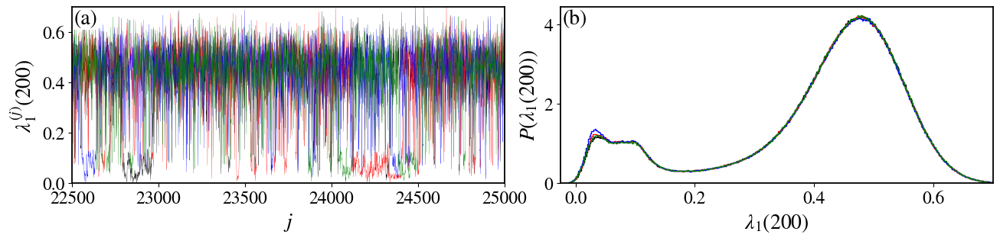

In [ ]:
plot_params()
fig, ax = plt.subplots(1, 2, figsize=(13,3))
lw = 0.2
xbox = 0.0045
ybox = 0.905
bbox = {'linewidth': 0.0, 'facecolor': 'white', 'alpha': 1.0, 'pad': 1}
for i in range(len(x0[1])):
    ax[0].plot(ftle_2[i][:, 0], c=colors[i], lw=lw);
ax[0].set_xlim(22500, 25000)
ax[0].set_xlabel("$j$")
ax[0].set_ylabel("$\\lambda_1^{(j)}(%i)$" % n)
ax[0].set_ylim(0, 0.7)

for i in range(len(x0[1])):
    ax[1].hist(ftle_2[i][:, 0], density=True, histtype="step", color=colors[i], bins="auto");
    #ax[1].hist(ftle_2[i][:, 1], density=True, histtype="step", color=colors[i], bins="auto",linestyle="dashed");

ax[1].set_xlim(-0.025, 0.7)
ax[1].set_xlabel("$\\lambda_1(%i)$" % n)
ax[1].set_ylabel("$P(\\lambda_1(%i))$" % n)
for i in range(2):
    ax[i].text(xbox, ybox, "(%s)" % (ascii_lowercase[i]), transform=ax[i].transAxes, bbox=bbox)
plt.subplots_adjust(left=0.065, bottom=0.21, right=0.99, top=0.98, wspace=0.13)
plt.savefig("Figures/stdmap_FTLE.png", dpi=500)

## LE for a grid of IC

### In phase space

In [ ]:
L = 1000
x0 = np.linspace(-np.pi, np.pi, L, endpoint=True)
y0 = np.linspace(-np.pi, np.pi, L, endpoint=True)
x0, y0 = np.meshgrid(x0, y0)
k = [0.9, 1.5, 3.63, 5.3]
N = int(1e4)

In [ ]:
lypnv = [Parallel(n_jobs=-1)(delayed(lyapunov)(x0[i, j], y0[i, j], k[l], N) for i in range(L) for j in range(L)) for l in range(len(k))]

<Figure size 640x480 with 0 Axes>

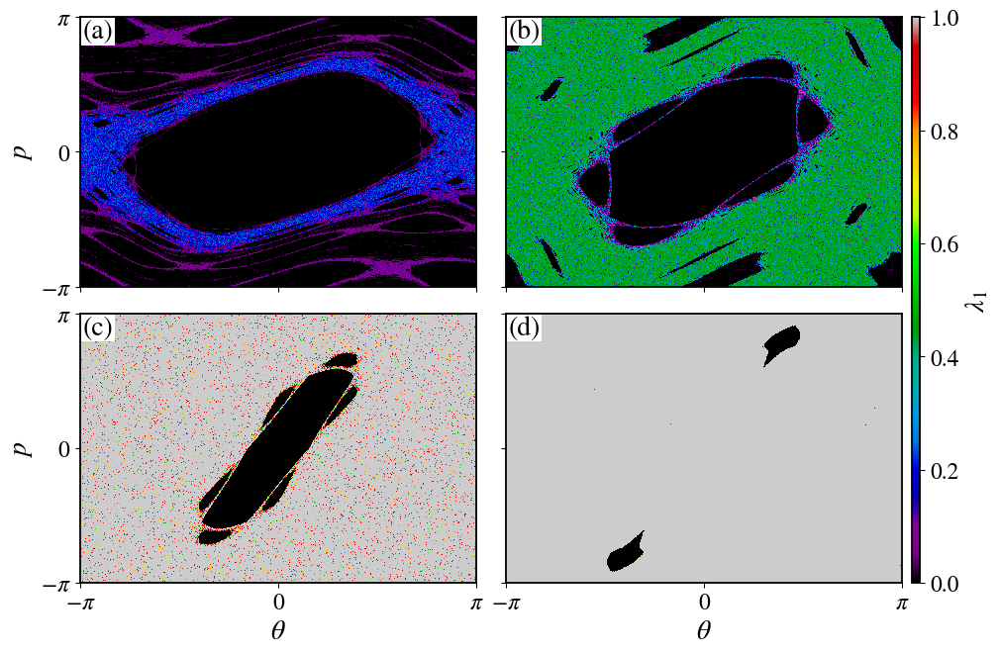

In [ ]:
plot_params()
fig, ax = plt.subplots(2, 2, sharex=True, sharey=True, figsize=(10, 6.5))
xbox = 0.0062
ybox = 0.922
bbox = {'linewidth': 0.0, 'facecolor': 'white', 'alpha': 1.0, 'pad': 1}
for i in range(len(lypnv)):
    LL = np.array(lypnv)[i][:, 0].reshape((L, L))
    hm = ax[int(i / 2), i % 2].pcolor(x0, y0, LL, vmin=0, vmax=1.0, shading="auto", cmap="nipy_spectral")
    ax[int(i / 2), i % 2].text(xbox, ybox, "(%s)" % (ascii_lowercase[i]), transform=ax[int(i / 2), i % 2].transAxes, bbox=bbox)

ax[0,0].set_xlim(-np.pi, np.pi)
ax[0,0].set_ylim(-np.pi, np.pi)
ax[0,0].set_xticks([-np.pi, 0, np.pi])
ax[0,0].set_xticklabels(["$-\\pi$", "$0$", "$\\pi$"])
ax[0,0].set_yticks([-np.pi, 0, np.pi])
ax[0,0].set_yticklabels(["$-\\pi$", "$0$", "$\\pi$"])

ax[0,0].set_ylabel("$p$")
ax[1,0].set_ylabel("$p$")
ax[1,0].set_xlabel("$\\theta$")
ax[1,1].set_xlabel("$\\theta$")
cbar_ax = fig.add_axes([0.92, 0.10, 0.008, 0.98-0.10])
cbar = fig.colorbar(hm, cax=cbar_ax, label='$\\lambda_1$')
plt.subplots_adjust(left=0.08, bottom=0.10, right=0.91, top=0.98, wspace=0.075, hspace=0.1)
plt.savefig("Figures/stdmap_grid_lypnv.png", dpi=500)

### In parameter space

#### Full space

In [ ]:
L = 1000
x0 = np.linspace(-np.pi, np.pi, L, endpoint=True)
k = np.linspace(0, 5, L, endpoint=True)
y0 = 0
k, x0 = np.meshgrid(k, x0)
N = int(1e4)

lypnv_x0 = Parallel(n_jobs=-1)(delayed(lyapunov)(x0[i, j], y0, k[i, j], N) for i in range(L) for j in range(L))

In [ ]:
L = 1000
y0 = np.linspace(-np.pi, np.pi, L, endpoint=True)
k = np.linspace(0, 5, L, endpoint=True)
x0 = 0
k, y0 = np.meshgrid(k, y0)
N = int(1e4)

lypnv_y0 = Parallel(n_jobs=-1)(delayed(lyapunov)(x0, y0[i, j], k[i, j], N) for i in range(L) for j in range(L))

#### Magnification

In [ ]:
L = 1000
x0 = np.linspace(0.5, 2, L, endpoint=True)
k = np.linspace(2, 3.5, L, endpoint=True)
y0 = 0
k, x0 = np.meshgrid(k, x0)
N = int(1e4)

lypnv_x0_zoom = Parallel(n_jobs=-1)(delayed(lyapunov)(x0[i, j], y0, k[i, j], N) for i in range(L) for j in range(L))

In [ ]:
L = 1000
y0 = np.linspace(np.pi/2, np.pi, L, endpoint=True)
k = np.linspace(0, 2, L, endpoint=True)
x0 = 0
k, y0 = np.meshgrid(k, y0)
N = int(1e4)

lypnv_y0_zoom = Parallel(n_jobs=-1)(delayed(lyapunov)(x0, y0[i, j], k[i, j], N) for i in range(L) for j in range(L))

In [ ]:
L = 1000
x0 = np.linspace(-0.8, 0, L, endpoint=True)
k = np.linspace(2.5, 4.75, L, endpoint=True)
y0 = 0
k, x0 = np.meshgrid(k, x0)
N = int(1e4)

lypnv_x0_zoom2 = Parallel(n_jobs=-1)(delayed(lyapunov)(x0[i, j], y0, k[i, j], N) for i in range(L) for j in range(L))

In [ ]:
L = 1000
y0 = np.linspace(-1.5, 0, L, endpoint=True)
k = np.linspace(2, 4.75, L, endpoint=True)
x0 = 0
k, y0 = np.meshgrid(k, y0)
N = int(1e4)

lypnv_y0_zoom2 = Parallel(n_jobs=-1)(delayed(lyapunov)(x0, y0[i, j], k[i, j], N) for i in range(L) for j in range(L))

<Figure size 640x480 with 0 Axes>

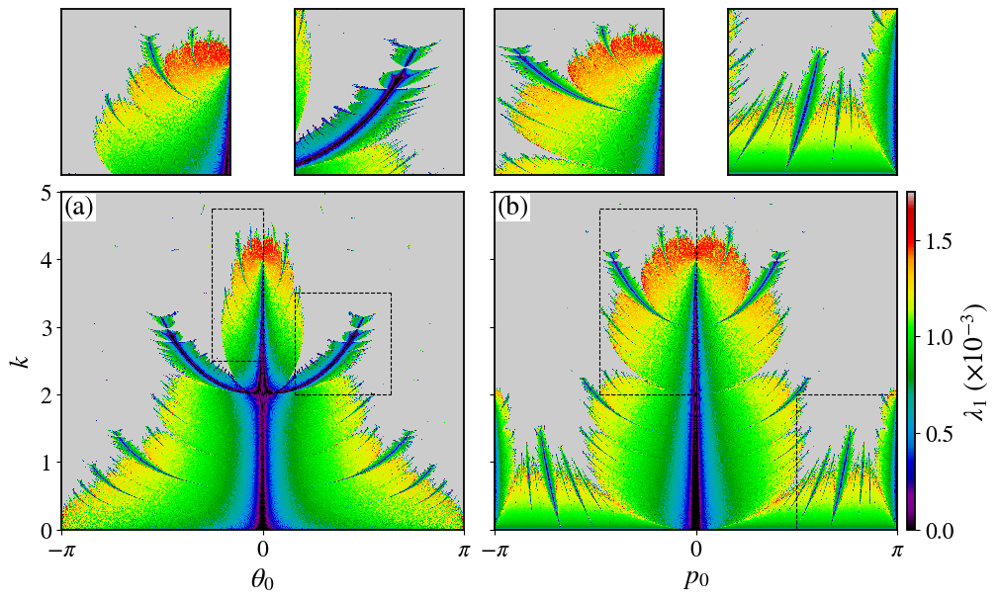

In [ ]:
plot_params()
fig, ax = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(10, 6))
xbox = 0.0062
ybox = 0.9345
bbox = {'linewidth': 0.0, 'facecolor': 'white', 'alpha': 1.0, 'pad': 1}
cmap = "nipy_spectral"
vmax = 1.75
x0 = np.linspace(-np.pi, np.pi, L, endpoint=True)
k = np.linspace(0, 5, L, endpoint=True)
k, x0 = np.meshgrid(k, x0)
LL = np.array(lypnv_x0)[0][:, 0].reshape((L, L))/1e-3
hm = ax[0].pcolor(x0, k, LL, vmin=0, vmax=vmax, shading="auto", cmap=cmap)

ax_ins = ax[0].inset_axes([0.58, 1.05, 0.42, 0.49])
x0z = np.linspace(0.5, 2, L, endpoint=True)
kz = np.linspace(2, 3.5, L, endpoint=True)
kz, x0z = np.meshgrid(kz, x0z)
LLz = np.array(lypnv_x0_zoom)[:, 0].reshape((L, L))/1e-3
ax_ins.pcolor(x0z, kz, LLz, vmin=0, vmax=vmax, shading="auto", cmap=cmap)
ax_ins.set_xticks([])
ax_ins.set_yticks([])

ax_ins = ax[0].inset_axes([0., 1.05, 0.42, 0.49])
x0z = np.linspace(-0.8, 0, L, endpoint=True)
kz = np.linspace(2.5, 4.75, L, endpoint=True)
kz, x0z = np.meshgrid(kz, x0z)
LLz = np.array(lypnv_x0_zoom2)[:, 0].reshape((L, L))/1e-3
ax_ins.pcolor(x0z, kz, LLz, vmin=0, vmax=vmax, shading="auto", cmap=cmap)
ax_ins.set_xticks([])
ax_ins.set_yticks([])

ax[0].plot([0.5, 2], [2, 2], "k--", lw=0.8)
ax[0].plot([2, 2], [2, 3.5], "k--", lw=0.8)
ax[0].plot([0.5, 2], [3.5, 3.5], "k--", lw=0.8)
ax[0].plot([0.5, 0.5], [3.5, 2], "k--", lw=0.8)

ax[0].plot([-0.8, 0], [2.5, 2.5], "k--", lw=0.8)
ax[0].plot([0, 0], [2.5, 4.75], "k--", lw=0.8)
ax[0].plot([-0.8, 0], [4.75, 4.75], "k--", lw=0.8)
ax[0].plot([-0.8, -0.8], [4.75, 2.5], "k--", lw=0.8)

#####################################

y0 = np.linspace(-np.pi, np.pi, L, endpoint=True)
k = np.linspace(0, 5, L, endpoint=True)
k, y0 = np.meshgrid(k, y0)
LL = np.array(lypnv_y0)[1][:, 0].reshape((L, L))/1e-3
hm = ax[1].pcolor(y0, k, LL, vmin=0, vmax=vmax, shading="auto", cmap=cmap)

y0_zoom_ini = np.pi/2
y0_zoom_end = np.pi
ky0_zoom_ini = 0
ky0_zoom_end = 2

ax_ins = ax[1].inset_axes([0.58, 1.05, 0.42, 0.49])
y0z = np.linspace(np.pi/2, np.pi, L, endpoint=True)
kz = np.linspace(0, 2, L, endpoint=True)
kz, y0z = np.meshgrid(kz, y0z)
LLz = np.array(lypnv_y0_zoom)[:, 0].reshape((L, L))/1e-3
ax_ins.pcolor(y0z, kz, LLz, vmin=0, vmax=vmax, shading="auto", cmap=cmap)
ax_ins.set_xticks([])
ax_ins.set_yticks([])

ax_ins = ax[1].inset_axes([0., 1.05, 0.42, 0.49])
y0z = np.linspace(-1.5, 0, L, endpoint=True)
kz = np.linspace(2, 4.75, L, endpoint=True)
kz, y0z = np.meshgrid(kz, y0z)
LLz = np.array(lypnv_y0_zoom2)[:, 0].reshape((L, L))/1e-3
ax_ins.pcolor(y0z, kz, LLz, vmin=0, vmax=vmax, shading="auto", cmap=cmap)
ax_ins.set_xticks([])
ax_ins.set_yticks([])

ax[1].plot([np.pi/2, np.pi], [0,0], "k--", lw=0.8)
ax[1].plot([np.pi, np.pi], [0, 2], "k--", lw=0.8)
ax[1].plot([np.pi/2, np.pi], [2, 2], "k--", lw=0.8)
ax[1].plot([np.pi/2, np.pi/2], [0, 2], "k--", lw=0.8)

ax[1].plot([-1.5, 0], [2, 2], "k--", lw=0.8)
ax[1].plot([0, 0], [2, 4.75], "k--", lw=0.8)
ax[1].plot([-1.5, 0], [4.75, 4.75], "k--", lw=0.8)
ax[1].plot([-1.5, -1.5], [2, 4.75], "k--", lw=0.8)

for i in range(len(cgbd_lypnv)):
    ax[i].text(xbox, ybox, "(%s)" % (ascii_lowercase[i]), transform=ax[i].transAxes, bbox=bbox)

ax[0].set_ylim(0, 5)
ax[0].set_xlim(-np.pi, np.pi)
ax[0].set_xticks([-np.pi, 0, np.pi])
ax[0].set_xticklabels(["$-\\pi$", "$0$", "$\\pi$"])
ax[0].set_ylabel("$k$")
ax[0].set_xlabel("$\\theta_0$")
ax[1].set_xlabel("$p_0$")

cbar_ax = fig.add_axes([0.915, 0.1, 0.008, 0.67-0.1])
cbar = fig.colorbar(hm, cax=cbar_ax, label='$\\lambda_1$ ($\\times 10^{-3}$)', ticks=[0, 0.5, 1., 1.5])
plt.subplots_adjust(left=0.06, bottom=0.1, right=0.905, top=0.67, wspace=0.075, hspace=0.1)
plt.savefig("Figures/stdmap_grid_cgbdlypnv_inset2.png", dpi=500)

### Both

In [2]:
L = 1000
x0 = np.linspace(-np.pi, np.pi, L, endpoint=True)
y0 = np.linspace(-np.pi, np.pi, L, endpoint=True)
x0, y0 = np.meshgrid(x0, y0)
k = 1.5
N = int(5000)
lypnv_PS = Parallel(n_jobs=-1)(delayed(lyapunov)(x0[i, j], y0[i, j], k, N) for i in range(L) for j in range(L))

In [16]:
np.array(lypnv_PS)[:, 0]

array([0.00032936, 0.00030068, 0.00022491, ..., 0.00022491, 0.00030068,
       0.00032936])

In [3]:
L = 1000
x0 = np.linspace(1.45, 2.2, L, endpoint=True)
y0 = np.linspace(-0.2, 1.7, L, endpoint=True)
x0, y0 = np.meshgrid(x0, y0)
k = 1.5
N = int(5000)
lypnv_PS_zoom = Parallel(n_jobs=-1)(delayed(lyapunov)(x0[i, j], y0[i, j], k, N) for i in range(L) for j in range(L))

In [5]:
L = 1000
x0 = 0
k = np.linspace(0, 5, L, endpoint=True)
y0 = np.linspace(-np.pi, np.pi, L, endpoint=True)
k, y0 = np.meshgrid(k, y0)
N = int(5000)
lypnv_CGBD = Parallel(n_jobs=-1)(delayed(lyapunov)(x0, y0[i, j], k[i, j], N) for i in range(L) for j in range(L))

<Figure size 640x480 with 0 Axes>

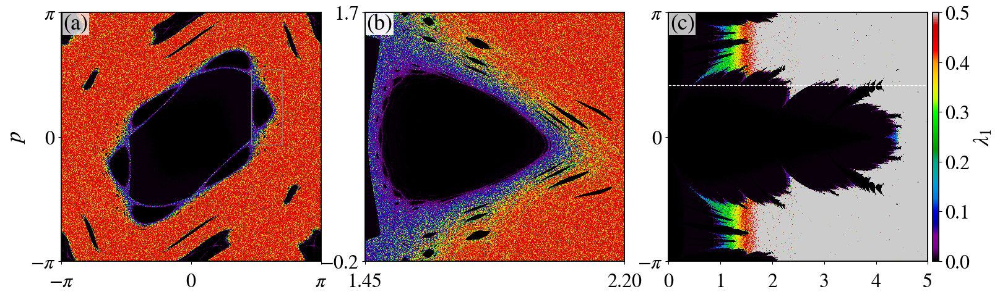

In [38]:
plot_params(fontsize=26, tick_labelsize=23)
xbox = 0.00625
ybox = 0.93225
bbox = {'linewidth': 0.0, 'facecolor': 'white', 'alpha': 0.75, 'pad': 1}
label = 'abc'
xl = ['x', 'x', 'k']
fig, ax = plt.subplots(1, 3, facecolor='w', figsize=(16, 5))
x0 = np.linspace(-np.pi, np.pi, L, endpoint=True)
y0 = np.linspace(-np.pi, np.pi, L, endpoint=True)
x0, y0 = np.meshgrid(x0, y0)

hm = ax[0].pcolor(x0, y0, np.array(lypnv_PS)[:, 0].reshape((L, L)), vmin=0, vmax=0.5, shading='auto', cmap="nipy_spectral")
ax[0].set_xlim(x0.min(), x0.max())
ax[0].set_ylim(y0.min(), y0.max())
ax[0].text(xbox, ybox, '(a)', transform=ax[0].transAxes, bbox=bbox)
ax[0].set_xticks([-np.pi, 0, np.pi]), ax[0].set_yticks([-np.pi, 0, np.pi])
ax[0].set_xticklabels(['$-\\pi$', '$0$', '$\\pi$']), ax[0].set_yticklabels(['$-\\pi$', '$0$', '$\\pi$'])
ax[0].tick_params(axis='x', which='major', pad=10)
ax[0].set_ylabel('$p$')
LW = 1
aux = "-"
ax[0].plot([1.45, 2.2], [-0.2, -0.2], aux, c="grey", lw=LW)
ax[0].plot([2.2, 2.2], [-0.2, 1.7], aux, c="grey", lw=LW)
ax[0].plot([1.45, 2.2], [1.7, 1.7], aux, c="grey", lw=LW)
ax[0].plot([1.45, 1.45], [1.7, -0.2], aux, c="grey", lw=LW)
###################################################
x0 = np.linspace(1.45, 2.2, L, endpoint=True)
y0 = np.linspace(-0.2, 1.7, L, endpoint=True)
x0, y0 = np.meshgrid(x0, y0)
hm = ax[1].pcolor(x0, y0, np.array(lypnv_PS_zoom)[:, 0].reshape((L, L)), vmin=0, vmax=0.5, shading='auto', cmap="nipy_spectral")
ax[1].set_xlim(x0.min(), x0.max())
ax[1].set_ylim(y0.min(), y0.max())
ax[1].text(xbox, ybox, '(b)', transform=ax[1].transAxes, bbox=bbox)
ax[1].set_xticks([x0.min(), x0.max()]), ax[1].set_yticks([y0.min(), y0.max()])
ax[1].tick_params(axis='x', which='major', pad=10)
###################################################
k = np.linspace(0, 5, L, endpoint=True)
y0 = np.linspace(-np.pi, np.pi, L, endpoint=True)
k, y0 = np.meshgrid(k, y0)
hm = ax[2].pcolor(k, y0, np.array(lypnv_CGBD)[:, 0].reshape((L, L)), vmin=0, vmax=0.5, shading='auto', cmap="nipy_spectral")
ax[2].set_xlim(k.min(), k.max())
ax[2].set_ylim(y0.min(), y0.max())
ax[2].text(xbox, ybox, '(b)', transform=ax[1].transAxes, bbox=bbox)
ax[2].set_yticks([y0.min(), 0, y0.max()])
ax[2].set_yticklabels(['$-\\pi$', '$0$', '$\\pi$'])
ax[2].set_xticks([0, 1, 2, 3, 4, 5])
ax[2].tick_params(axis='x', which='major', pad=10)
ax[2].text(xbox, ybox, '(c)', transform=ax[2].transAxes, bbox=bbox)

ax[-1].plot([0, 5], [1.3, 1.3], 'w--', lw=0.9)

cbar_ax = fig.add_axes([0.935, 0.165, 0.006, 0.97-0.165])
cbar = fig.colorbar(hm, cax=cbar_ax, label='$\\lambda_{1}$')
plt.subplots_adjust(left=0.055, bottom=0.165, right=0.93, top=0.97, wspace=0.17)
plt.savefig("Figures/stdmap_lyapunov_zoom.png", dpi=300)

## Difusion

### Diffusion

In [ ]:
nx = int(10**2)
ny = int(10**2)
n_ic = int(nx*ny)
x_ini = -np.pi
x_end = np.pi
y_ini = -np.pi
y_end = np.pi
dk = 0.025
k0 = 2
kf = 70
nk = round((kf - k0)/dk)
ka = np.linspace(k0, kf, nk)
N0 = int(1e3)
N1 = int(5e3)
N2 = int(1e4)
nk

2720

In [ ]:
D0a = Parallel(n_jobs=-1)(delayed(diffusion_coef)(np.array([x_ini, x_end]), np.array([y_ini, y_end]), nx, ny, ka[i], N0) for i in range(len(ka)))

In [ ]:
D1a = Parallel(n_jobs=-1)(delayed(diffusion_coef)(np.array([x_ini, x_end]), np.array([y_ini, y_end]), nx, ny, ka[i], N1) for i in range(len(ka)))

In [ ]:
D2a = Parallel(n_jobs=-1)(delayed(diffusion_coef)(np.array([x_ini, x_end]), np.array([y_ini, y_end]), nx, ny, ka[i], N2) for i in range(len(ka)))

In [ ]:
from scipy.special import jv

In [ ]:
KK0 = 2
KKf = 4.5
Kcr = 0.9716
KK1 = np.linspace(KK0, KKf, 1000)
DD1 = 0.15*(KK1 - Kcr)**3

In [ ]:
KK0 = 4.5
KKf = kf
KK2 = np.linspace(KK0, KKf, 1000)
DD2 = KK2**2*(1 - 2*jv(2, KK2))*(1 - jv(2, KK2))/2

<Figure size 640x480 with 0 Axes>

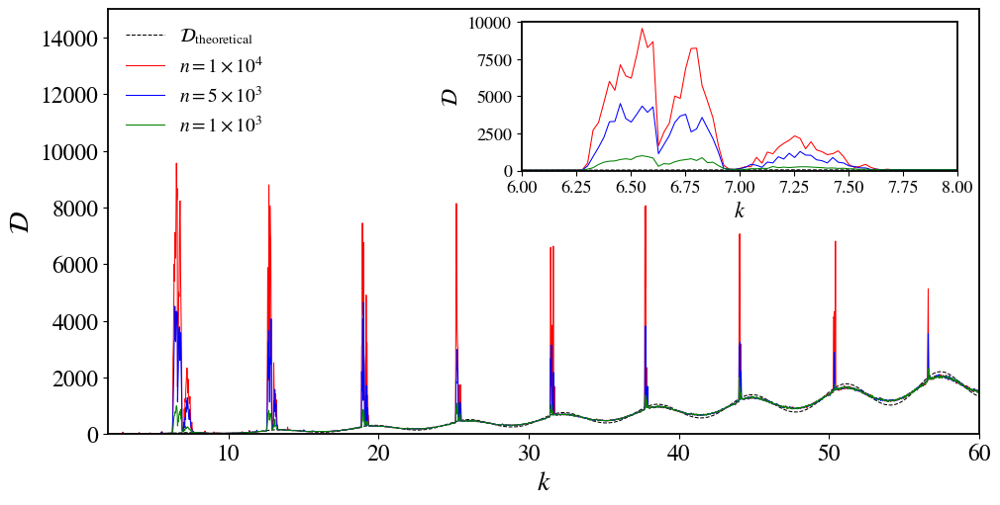

In [ ]:
plot_params()
fig, ax = plt.subplots(figsize=(10, 5))
plt.plot(KK1, DD1, "k--", lw=0.75, label="$\\mathcal{D}_{\\mathrm{theoretical}}$")
plt.plot(KK2, DD2, "k--", lw=0.75)
plt.plot(ka, D2a, "r", lw=0.75, label="$n = 1\\times 10^{4}$")
plt.plot(ka, D1a, "b", lw=0.75, label="$n = 5\\times 10^{3}$")
plt.plot(ka, D0a, "g", lw=0.75, label="$n = 1\\times 10^{3}$")
plt.xlabel("$k$")
plt.ylabel("$\\mathcal{D}$")
plt.xlim(ka.min(), 60)
plt.ylim(0, 15000)

ax_ins = ax.inset_axes([0.475, 0.62, 0.5, 0.35])
ax_ins.plot(KK1, DD1, "k--", lw=0.75, label="$\\mathcal{D}_{\\mathrm{theoretical}}$")
ax_ins.plot(KK2, DD2, "k--", lw=0.75)
ax_ins.plot(ka, D2a, "r", lw=0.75)
ax_ins.plot(ka, D1a, "b", lw=0.75)
ax_ins.plot(ka, D0a, "g", lw=0.75)
ax_ins.set_xlim(6, 8)
ax_ins.set_ylim(0, 10000)
ax_ins.set_yticks([0, 2500, 5000, 7500, 10000])
ax_ins.tick_params(axis='both', which='major', labelsize=13)
ax_ins.set_ylabel("$\\mathcal{D}$", fontsize=16)
ax_ins.set_xlabel("$k$", fontsize=16)
plt.legend(loc="upper left", frameon=False)
plt.subplots_adjust(left=0.1, bottom=0.12, right=0.98, top=0.98)
plt.savefig("Figures/stdmap_diffusioncoefvsk.png", dpi = 500)

### Self-similarity of islands

In [ ]:
k = 6.908745
n_icx = 10
n_icy = 200
N = [20000, int(5e4), int(4e5), int(4e5), int(5e5), int(1e6)]
x_ini = [-np.pi, 0.83, 1.22, 1.265, 1.2705, 1.27222]
x_end = [np.pi, 1.47, 1.43, 1.2794, 1.2725, 1.27234]
y_ini = [-np.pi, -0.6, -0.05, -0.019, -0.01103, -0.01089]
y_end = [np.pi, 0.6, 0.05, -0.009, -0.01046, -0.01079]

<Figure size 640x480 with 0 Axes>

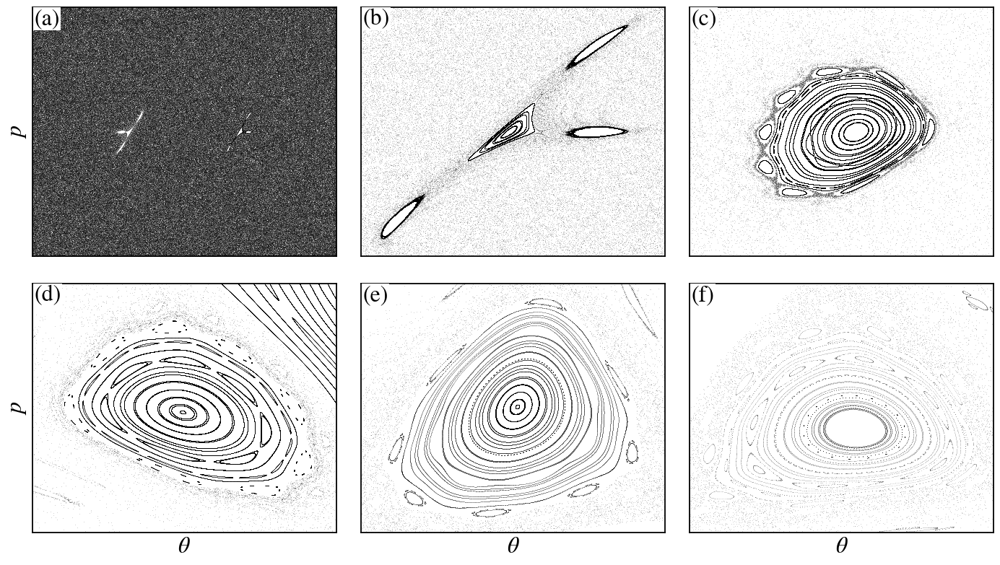

In [ ]:
plt.clf()
plot_params(fontsize=23, tick_labelsize=20)
xbox = 0.0051
ybox = 0.93
bbox = {'linewidth': 0.0, 'facecolor': 'white', 'alpha': 1.0, 'pad': 1}
fig, ax = plt.subplots(2, 3, figsize=(14, 8))
np.random.seed(13)
n_ic = 50
"""x0 = [x_ini[0] + (x_end[0] - x_ini[0])*np.random.rand(n_ic), [1.3, 1.3, 1.3, 1.17, 1.212, 1.2125]]
y0 = [y_ini[0] + (y_end[0] - y_ini[0])*np.random.rand(n_ic), [0, 0.02, 0.025, 0, 0, 0]]
x0 = [x_ini[0] + (x_end[0] - x_ini[0])*np.random.rand(n_ic), np.linspace(1.1, 1.4, n_ic), np.linspace(1.4, 1.25, n_ic), np.linspace(x_ini[3], x_end[3], n_ic)]
y0 = [y_ini[0] + (y_end[0] - y_ini[0])*np.random.rand(n_ic), np.zeros(n_ic), np.linspace(0, 0.01, n_ic), np.linspace(y_ini[3], y_end[3], n_ic)]"""
for i in range(len(x_ini)):
    x0 = np.linspace(x_ini[i], x_end[i], n_ic)
    y0 = np.linspace(y_ini[i], y_end[i], n_ic)
    for l in range(n_ic):
        ts = time_series_stdmap(x0[l], y0[l], k, N[i])
        ax[int(i / 3), i % 3].plot(ts[:, 0], ts[:, 1], "ko", markersize=0.25, markeredgewidth=0)
        ts = 0
    ax[int(i / 3), i % 3].text(xbox, ybox, '(%s)' % ascii_lowercase[i], transform=ax[int(i / 3), i % 3].transAxes, bbox=bbox)
    ax[int(i / 3), i % 3].set_xlim(x_ini[i], x_end[i])
    ax[int(i / 3), i % 3].set_ylim(y_ini[i], y_end[i])
for i in range(6):
    ax[int(i / 3), i % 3].set_xticks([])    
    ax[int(i / 3), i % 3].set_yticks([])
plt.tight_layout()
ax[0,0].set_ylabel("$p$")
ax[1,0].set_ylabel("$p$")
ax[1,0].set_xlabel("$\\theta$")
ax[1,1].set_xlabel("$\\theta$")
ax[1,2].set_xlabel("$\\theta$")
plt.show()
#plt.savefig("Figures/stdmap_phase_space_self_similar.png", dpi=500)

### Diffusion exponent

In [ ]:
ks = np.array([6.0, 6.25, 6.5, 6.625, 6.75, 7])
n_ic = 100
N = 20000
x_ini = -np.pi
x_end = np.pi
y_ini = -np.pi
y_end = np.pi

<Figure size 640x480 with 0 Axes>

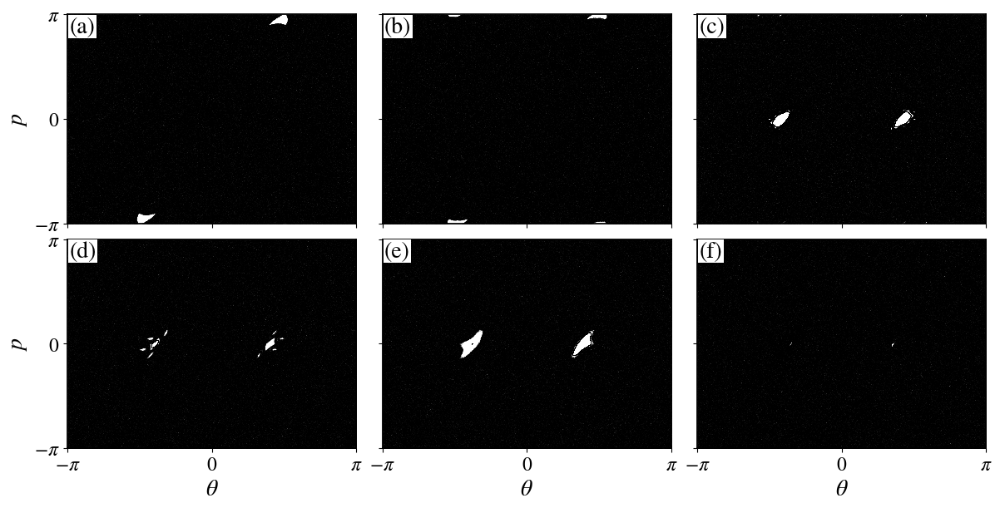

In [ ]:
plot_params()
fig, ax = plt.subplots(2, 3, sharex=True, sharey=True, figsize=(12, 6))
xbox = 0.007
ybox = 0.915
bbox = {'linewidth': 0.0, 'facecolor': 'white', 'alpha': 1.0, 'pad': 1}
for i, k in enumerate(ks):
    np.random.seed(131313)
    for j in range(n_ic):
        x0 = (x_end - x_ini)*np.random.rand()
        y0 = (y_end - y_ini)*np.random.rand()
        ts = time_series_stdmap(x0, y0, k, N)
        ax[int(i / 3), i % 3].plot(ts[:, 0], ts[:, 1], "ko", markersize=0.25, markeredgewidth=0)
        ax[int(i / 3), i % 3].text(xbox, ybox, "(%s)" % (ascii_lowercase[i]), transform=ax[int(i / 3), i % 3].transAxes, bbox=bbox)

ax[0,0].set_xlim(x_ini, x_end), ax[0,0].set_ylim(y_ini, y_end);
ax[0, 0].set_ylabel("$p$"), ax[1, 0].set_ylabel("$p$")
ax[1, 0].set_xlabel("$\\theta$"), ax[1, 1].set_xlabel("$\\theta$"), ax[1, 2].set_xlabel("$\\theta$")
ax[0, 0].set_xticks([-np.pi, 0, np.pi]), ax[0, 0].set_yticks([-np.pi, 0, np.pi])
ax[0, 0].set_xticklabels(["$-\\pi$", "$0$", "$\\pi$"]), ax[0, 0].set_yticklabels(["$-\\pi$", "$0$", "$\\pi$"]);
plt.subplots_adjust(left=0.06, right=0.98, top=0.98, hspace=0.075, wspace=0.09)
#plt.savefig("Figures/stdmap_phase_space.png", dpi=500)

In [ ]:
n_icx = 30
n_icy = 30
N = int(1e8)
n = 200

In [ ]:
xlims = np.array([x_ini, x_end])
ylims = np.array([y_ini, y_end])
ymean2 = Parallel(n_jobs=-1)(delayed(ymean2_vs_k)(ks[i], N, n, n_icx, n_icy, xlims, ylims) for i in range(len(ks)))

6.0 1.0148346012027114 22.03030355926439
6.25 1.0465403105604063 14.0061855706866
6.5 1.9999905777926275 0.3509806619361386
6.625 1.9998429595031142 0.08798410704047836
6.75 1.9999842891042574 0.26326664538193806
7.0 0.9942665383409099 83.23052784289703


<Figure size 640x480 with 0 Axes>

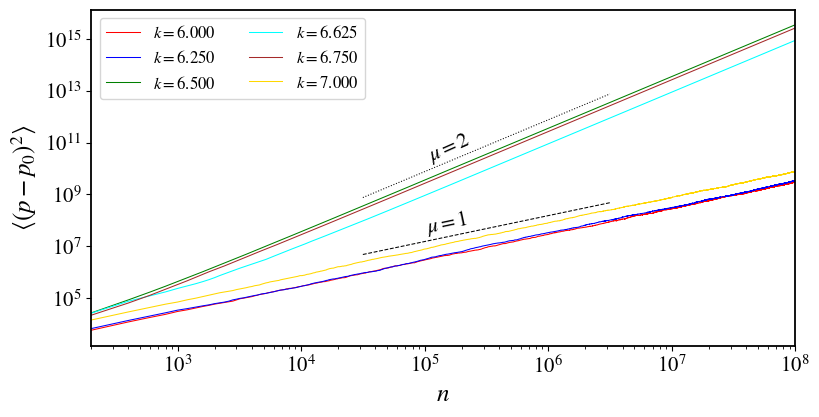

In [ ]:
plot_params(fontsize=18, tick_labelsize=15, legend_fontsize=12)
plt.subplots(figsize=(8, 4))
t = np.arange(n, N + n, n)
colors = ["red", "blue", "green", "cyan", "brown", "gold"]
for i in range(len(ks)):
    y_fit = ymean2[i][50000:]
    t_fit = t[50000:]
    a, b = np.polyfit(np.log10(t_fit), np.log10(y_fit), 1)
    print(ks[i], a, 10**b)
    plt.plot(t, ymean2[i][:], lw=0.75, label="$k = %.3f$" % ks[i], color=colors[i])

t_new = np.logspace(4.5, 6.5, 100)
y_new1 = 1.5e2*t_new
y_new2 = 0.75e0*t_new**2
plt.plot(t_new, y_new1, "k--", lw=0.75)
plt.plot(t_new, y_new2, "k:", lw=0.75)
plt.xscale("log")
plt.yscale("log")
plt.legend(loc="best", ncol=2)
plt.xlabel("$n$")
plt.ylabel("$\\langle(p - p_0)^2\\rangle$")
plt.xlim(t[0], t[-1]);
plt.text(1e5, 3.5e7, "$\\mu = 1$", rotation=12, fontsize=15)
plt.text(1e5, 0.2e11, "$\\mu = 2$", rotation=24, fontsize=15)
plt.subplots_adjust(left=0.1, bottom=0.14, right=0.98, top=0.98)
plt.savefig("Figures/stdmap_diffusionexponent.png", dpi=500)

In [ ]:
ks = np.array([6.0, 6.25, 6.5, 6.625, 6.75, 7])
n_ic = 100
N = 20000
x_ini = 0
x_end = 2*np.pi
y_ini = 0
y_end = 2*np.pi

<Figure size 640x480 with 0 Axes>

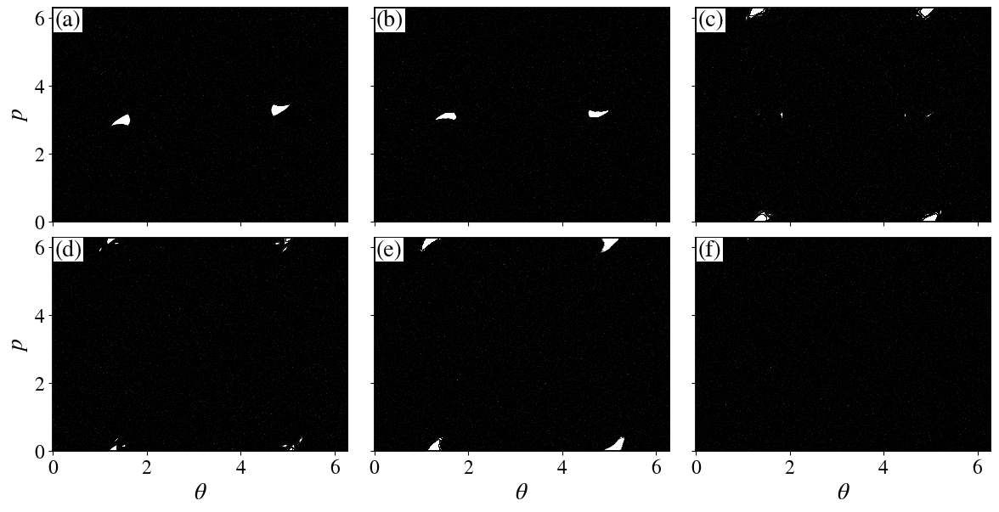

In [ ]:
plot_params()
fig, ax = plt.subplots(2, 3, sharex=True, sharey=True, figsize=(12, 6))
xbox = 0.007
ybox = 0.915
bbox = {'linewidth': 0.0, 'facecolor': 'white', 'alpha': 1.0, 'pad': 1}
for i, k in enumerate(ks):
    np.random.seed(131313)
    for j in range(n_ic):
        x0 = (x_end - x_ini)*np.random.rand()
        y0 = (y_end - y_ini)*np.random.rand()
        ts = time_series_stdmap_cylinder(x0, y0, k, N, 1)
        ax[int(i / 3), i % 3].plot(ts[:, 1], ts[:, 2] % (2*np.pi), "ko", markersize=0.25, markeredgewidth=0)
        ax[int(i / 3), i % 3].text(xbox, ybox, "(%s)" % (ascii_lowercase[i]), transform=ax[int(i / 3), i % 3].transAxes, bbox=bbox)

ax[0,0].set_xlim(x_ini, x_end), ax[0,0].set_ylim(y_ini, y_end);
ax[0, 0].set_ylabel("$p$"), ax[1, 0].set_ylabel("$p$")
ax[1, 0].set_xlabel("$\\theta$"), ax[1, 1].set_xlabel("$\\theta$"), ax[1, 2].set_xlabel("$\\theta$")
#ax[0, 0].set_xticks([-np.pi, 0, np.pi]), ax[0, 0].set_yticks([-np.pi, 0, np.pi])
#ax[0, 0].set_xticklabels(["$-\\pi$", "$0$", "$\\pi$"]), ax[0, 0].set_yticklabels(["$-\\pi$", "$0$", "$\\pi$"]);
plt.subplots_adjust(left=0.06, right=0.98, top=0.98, hspace=0.075, wspace=0.09)
#plt.savefig("Figures/stdmap_phase_space.png", dpi=500)

## dig

In [2]:
x_ini = [-np.pi, -np.pi, -1.5, -1.5, 0.8, 0.83]
x_end = [np.pi, np.pi, 1.5, 1.5, 1.6, 1.47]
y_ini = [-np.pi, -np.pi, -2.5, -2.5, 1.8, -0.6]
y_end = [np.pi, np.pi, 2.5, 2.5, 3.0, 0.6]
L = 1000
x = np.linspace(x_ini, x_end, L)
y = np.linspace(y_ini, y_end, L)
x, y = np.meshgrid(x, y)
ks = np.array([0.9, 1.5, 3.63, 4.0, 5.3, 6.908745])
N = int(1e6)

In [3]:
path = "/home/matheus/Doutorado/Tese/Dados/"
for l in range(2, len(ks)):
    k = ks[l]
    x = np.linspace(x_ini[l], x_end[l], L)
    y = np.linspace(y_ini[l], y_end[l], L)
    x, y = np.meshgrid(x, y)
    digN = dig(x, y, k, N)
    d = digN.reshape((L, L))
    with open(path + "dig_grid_L=%i_k=%.6f.dat" % (L, k), "w") as df:
        for i in range(L):
            for j in range(L):
                df.write("%.16f %.16f %.16f\n" % (x[i, j], y[i, j], d[i, j]))
            df.write("\n")

/tmp/ipykernel_685133/2023953760.py:7: RuntimeWarning: divide by zero encountered in dig
  digN = dig(x, y, k, N)


<Figure size 640x480 with 0 Axes>

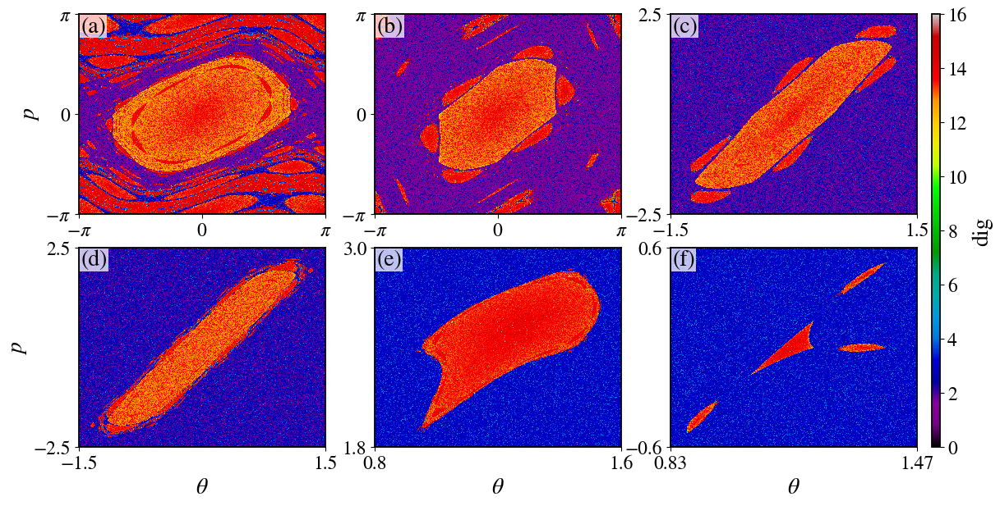

In [4]:
path = "/home/matheus/Doutorado/Tese/Dados/"
plot_params()
xbox = 0.0077
ybox = 0.912
bbox = {'linewidth': 0.0, 'facecolor': 'white', 'alpha': 0.75, 'pad': 1}
fig, ax = plt.subplots(2, 3, figsize=(12, 6))
for i, k in enumerate(ks):
    df = path + "dig_grid_L=%i_k=%.6f.dat" % (L, k)
    df = pd.read_csv(df, header=None, delim_whitespace=True)
    x = np.array(df[0])
    y = np.array(df[1])
    digN = np.array(df[2])
    M = int(np.sqrt(len(digN)))
    x = x.reshape((M, M))
    y = y.reshape((M, M))
    digN = digN.reshape((M, M))
    hm = ax[int(i / 3), i % 3].pcolor(x, y, digN, vmin=0, vmax=16, cmap="nipy_spectral")
    ax[int(i / 3), i % 3].text(xbox, ybox, '(%s)' % ascii_lowercase[i], transform=ax[int(i / 3), i % 3].transAxes, bbox=bbox)
    ax[int(i / 3), i % 3].set_xlim(x_ini[i], x_end[i]), ax[int(i / 3), i % 3].set_ylim(y_ini[i], y_end[i])
    if i == 0 or i == 1:
        ax[int(i / 3), i % 3].set_xticks([-np.pi, 0, np.pi]), ax[int(i / 3), i % 3].set_yticks([-np.pi, 0, np.pi])
        ax[int(i / 3), i % 3].set_xticklabels(["$-\\pi$", "$0$", "$\\pi$"]), ax[int(i / 3), i % 3].set_yticklabels(["$-\\pi$", "$0$", "$\\pi$"])
    else:
        ax[int(i / 3), i % 3].set_xticks([x_ini[i], x_end[i]]), ax[int(i / 3), i % 3].set_yticks([y_ini[i], y_end[i]])
ax[0, 0].set_ylabel("$p$"), ax[1, 0].set_ylabel("$p$")
ax[1, 0].set_xlabel("$\\theta$"), ax[1, 1].set_xlabel("$\\theta$"), ax[1, 2].set_xlabel("$\\theta$")
cbar_ax = fig.add_axes([0.935, 0.1, 0.008, 0.98-0.1])
cbar = fig.colorbar(hm, cax=cbar_ax, label='dig')
plt.subplots_adjust(left=0.07, bottom=0.1, right=0.92, top=0.98, hspace=0.17, wspace=0.20)
plt.savefig("Figures/stdmap_dig_grid.png", dpi=500)

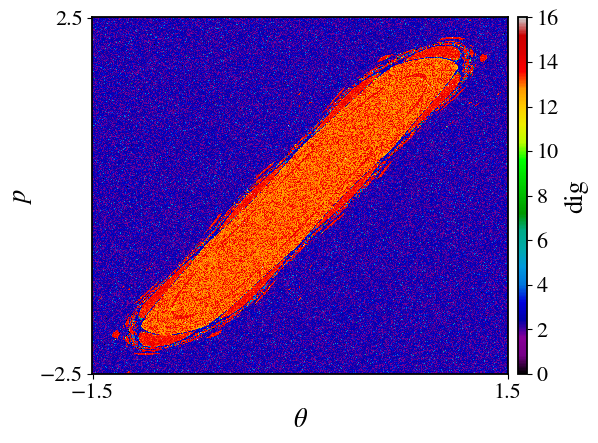

In [14]:
x_ini = -1.5
x_end = 1.5
y_ini = -2.5
y_end = 2.5
path = "/home/matheus/Doutorado/Tese/Dados/"
df = path + "dig_grid_L=%i_k=%.6f.dat" % (1000, 4.0)
df = pd.read_csv(df, header=None, delim_whitespace=True)
x = np.array(df[0])
y = np.array(df[1])
digN = np.array(df[2])
M = int(np.sqrt(len(digN)))
x = x.reshape((M, M))
y = y.reshape((M, M))
digN = digN.reshape((M, M))

plot_params(fontsize=19, tick_labelsize=16)

hm = plt.pcolor(x, y, digN, cmap="nipy_spectral", vmin=0, vmax=16)
plt.colorbar(hm, label="dig", ticks=[0, 2, 4, 6, 8, 10, 12, 14, 16], aspect=40, pad=0.02)

plt.xticks([x_ini, x_end])
plt.yticks([y_ini, y_end])
plt.xlabel("$\\theta$")
plt.ylabel("$p$")
plt.tight_layout()
plt.savefig("Figures/dig_grid_k=4.0.png", dpi=300, bbox_inches='tight', pad_inches=0.01)

<Figure size 640x480 with 0 Axes>

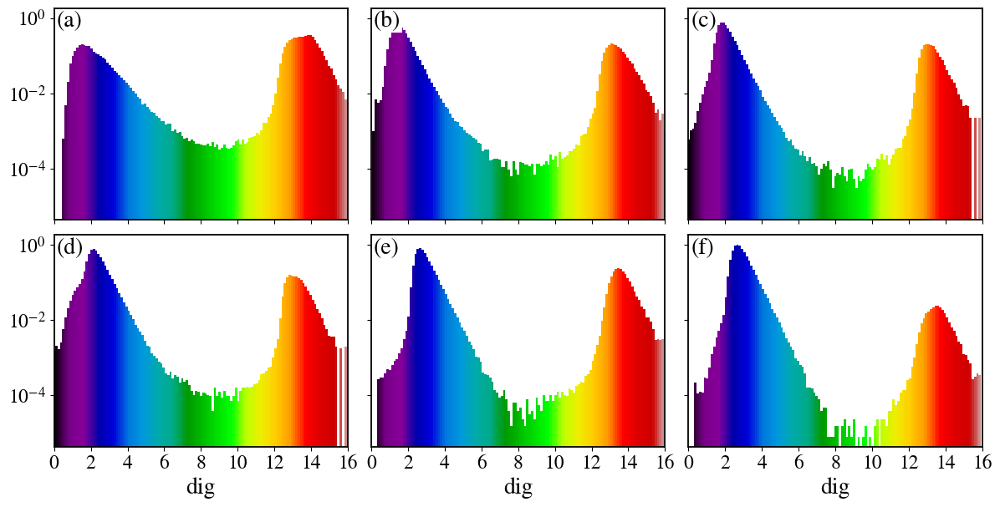

In [5]:
plot_params()
xbox = 0.0077
ybox = 0.912
bbox = {'linewidth': 0.0, 'facecolor': 'white', 'alpha': 1.0, 'pad': 1}
fig, ax = plt.subplots(2, 3, sharex=True, sharey=True, figsize=(12, 6))
cm = mpl.colormaps["nipy_spectral"]
binwidth = 1/8
for i, k in enumerate(ks):
    df = path + "dig_grid_L=%i_k=%.6f.dat" % (L, k)
    df = pd.read_csv(df, header=None, delim_whitespace=True)
    x = np.array(df[0])
    y = np.array(df[1])
    digN = np.array(df[2])
    Nb = (16 - 0)/binwidth
    bins = np.linspace(0, 16 + binwidth, int(Nb))
    Y, X = np.histogram(digN, bins, density=True)
    x_span = X.max() - X.min()
    C = [cm(((x-X.min())/x_span)) for x in X]
    ax[int(i / 3), i % 3].bar(X[:-1], Y, color=C, width=X[1]-X[0])
    ax[int(i / 3), i % 3].text(xbox, ybox, '(%s)' % ascii_lowercase[i], transform=ax[int(i / 3), i % 3].transAxes, bbox=bbox)
ax[0, 0].set_xticks([0, 2, 4, 6, 8, 10, 12, 14, 16])
ax[0, 0].set_xlim(0, 16)
ax[1, 0].set_xlabel("dig")
ax[1, 1].set_xlabel("dig")
ax[1, 2].set_xlabel("dig")
ax[0, 0].set_yscale("log")
plt.subplots_adjust(left=0.06, bottom=0.105, right=0.985, top=0.98, hspace=0.07, wspace=0.08)
plt.savefig("Figures/stdmap_dig_hist.png", dpi=500)

In [18]:
cut_off = np.linspace(0, 16, 100)
prop_chaos_reg = np.zeros((len(cut_off), len(ks)))
for i, k in enumerate(ks):
    df = path + "dig_grid_L=%i_k=%.6f.dat" % (L, k)
    df = pd.read_csv(df, header=None, delim_whitespace=True)
    digN = np.array(df[2])
    for j in range(len(cut_off)):
        prop_chaos_reg[j, i] = sum(l > cut_off[j] for l in digN)

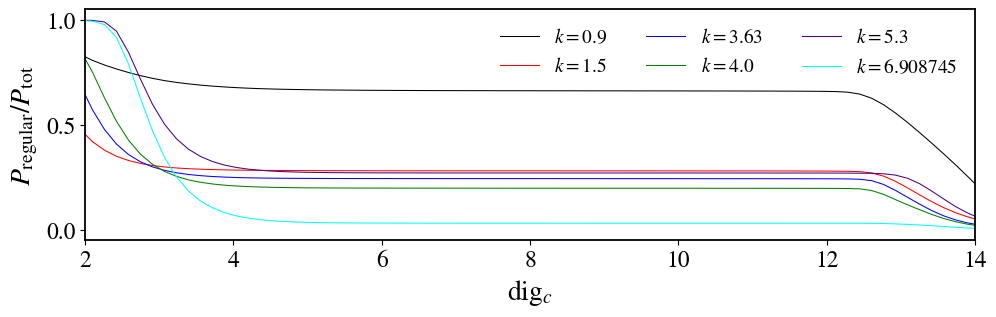

In [31]:
fig, ax = plt.subplots(figsize=(10, 3))
colors = ["black", "red", "blue", "green", "indigo", "cyan"]
label = ["$k = %.1f$", "$k = %.1f$", "$k = %.2f$", "$k = %.1f$", "$k = %.1f$", "$k = %.6f$"]
plot_params()
for i, k in enumerate(ks):
    plt.plot(cut_off, prop_chaos_reg[:, i]/len(digN), label=label[i] % k, lw=0.75, c=colors[i])
plt.xlim(2, 14)
plt.xlabel("dig$_c$")
plt.ylabel("$P_{\\mathrm{regular}}/P_{\\mathrm{tot}}$")
plt.legend(loc="upper right", frameon=False, ncol=3)
plt.subplots_adjust(left=0.09, bottom=0.21, right=0.98, top=0.98)
plt.savefig("Figures/stdmap_dig_cutoff.png", dpi=500)

## Self-similar structure

0 0 a 2000.0 -3.141592653589793 3.141592653589793 0.3
1 1 b 10000.0 0.83 1.47 0.3
2 2 c 20000.0 1.22 1.43 0.3
5 3 f 500000.0 1.27222 1.27234 0.75
4 4 e 200000.0 1.2705 1.2725 0.5
3 5 d 100000.0 1.265 1.2794 0.3


<Figure size 640x480 with 0 Axes>

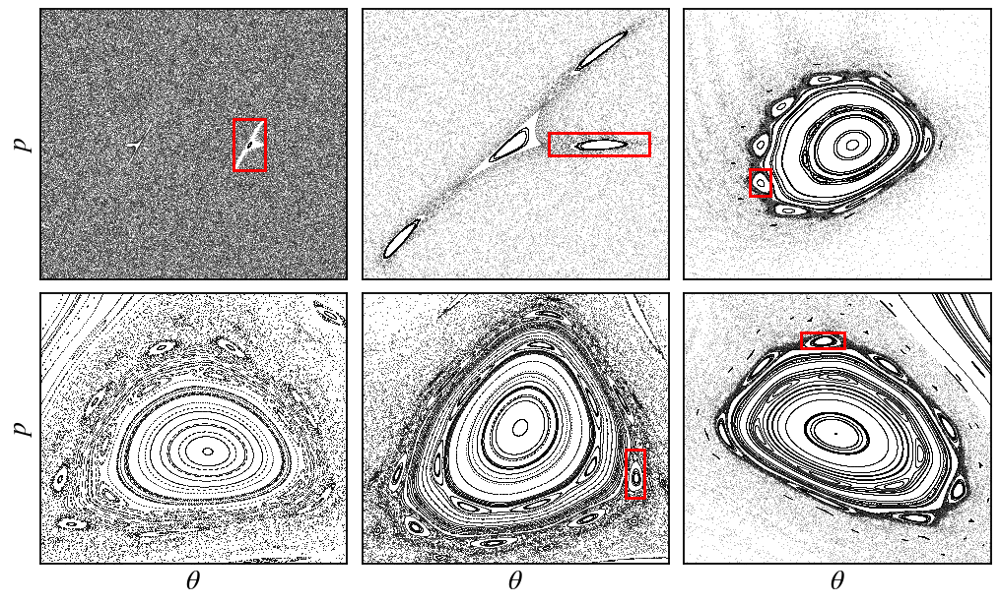

In [11]:
n_ic = 111
k = 6.908745
x_lims = np.array([[-np.pi, np.pi], [0.83, 1.47], [1.22, 1.43], [1.265, 1.2794], [1.2705, 1.2725], [1.27222, 1.27234]])
y_lims = np.array([[-np.pi, np.pi], [-0.6, 0.6], [-0.05, 0.05], [-0.019, -0.009], [-0.01103, -0.01046], [-0.01089, -0.01079]])

N = int(1e4)*np.ones(len(x_lims))
N[0] = 2e3
N[2] = 2e4
N[3] = 1e5
N[4] = 2e5
N[5] = 5e5
#N[:] = 1e3
ms = 0.3*np.ones(len(x_lims))
ms[4] = 0.5
ms[5] = 0.75
xbox = 0.0077
ybox = 0.922
bbox = {'linewidth': 0.0, 'facecolor': 'white', 'alpha': 0.05, 'pad': 1}
plot_params()
fig, ax = plt.subplots(2, 3, figsize=(10, 6))
for m in range(len(x_lims)):
    if m < 3:
        i = m
    else:
        i = - m + 8
    print(i, m, ascii_lowercase[i], N[i], x_lims[i][0], x_lims[i][1], ms[i])
    np.random.seed(113123)
    for j in range(n_ic):
        x0 = x_lims[i][0] + (x_lims[i][1] - x_lims[i][0])*np.random.rand()
        y0 = y_lims[i][0] + (y_lims[i][1] - y_lims[i][0])*np.random.rand()
        ts = time_series_stdmap(x0, y0, k, int(N[i]))
        ax[int(m / 3), m % 3].plot(ts[:, 0], ts[:, 1], "ko", markersize=ms[i], markeredgewidth=0)
        #ax[int(m / 3), m % 3].text(xbox, ybox, "(%s)" % (ascii_lowercase[i]), transform=ax[int(m / 3), m % 3].transAxes, bbox=bbox)
        ax[int(m / 3), m % 3].set_xticks([])
        ax[int(m / 3), m % 3].set_yticks([])
        ax[int(m / 3), m % 3].set_xlim(x_lims[i][0], x_lims[i][1])
        ax[int(m / 3), m % 3].set_ylim(y_lims[i][0], y_lims[i][1])
        if i != len(x_lims) - 1:
            ax[int(m / 3), m % 3].plot([x_lims[i + 1][0], x_lims[i + 1][1]], [y_lims[i + 1][0], y_lims[i + 1][0]], "r", lw=0.9)
            ax[int(m / 3), m % 3].plot([x_lims[i + 1][1], x_lims[i + 1][1]], [y_lims[i + 1][0], y_lims[i + 1][1]], "r", lw=0.9)
            ax[int(m / 3), m % 3].plot([x_lims[i + 1][0], x_lims[i + 1][1]], [y_lims[i + 1][1], y_lims[i + 1][1]], "r", lw=0.9)
            ax[int(m / 3), m % 3].plot([x_lims[i + 1][0], x_lims[i + 1][0]], [y_lims[i + 1][0], y_lims[i + 1][1]], "r", lw=0.9)
ax[0, 0].set_ylabel("$p$")
ax[1, 0].set_ylabel("$p$")
ax[1, 0].set_xlabel("$\\theta$")
ax[1, 1].set_xlabel("$\\theta$")
ax[1, 2].set_xlabel("$\\theta$")
plt.subplots_adjust(left=0.025, bottom=0.05, right=0.99, top=0.99, hspace=0.05, wspace=0.05)
plt.savefig("Figures/stdmap_selfsimilar.png", dpi=500)

## Escape times

In [ ]:
@njit
def escape_time(x0: float, y0: float, k: float, xlims: np.ndarray, ylims: np.ndarray, Nmax: int=int(1e8)) -> int:
    x = x0
    y = y0
    for i in range(1, Nmax + 1):
        y = y - k*np.sin(x)
        x = x + y

        if x < 0: x += 2*np.pi
        if x > np.pi: x -= 2*np.pi
        if y < 0: y += 2*np.pi
        if y > np.pi: y -= 2*np.pi

        if x > xlims[0] and x < xlims[1] and y > ylims[0] and y < ylims[1]:
            pass
        else:
            break
    
    return i

In [ ]:
L = 1000
k = 6.908745
xlims = np.array([[0.83, 1.47], [1.22, 1.43], [1.265, 1.2794], [1.2705, 1.2725], [1.27222, 1.27234]])
ylims = np.array([[-0.6, 0.6], [-0.05, 0.05], [-0.019, -0.009], [-0.01103, -0.01046], [-0.01089, -0.01079]])

In [ ]:
esct = []
x = []
y = []
path = "/home/matheus/Doutorado/Tese/Dados/"
for l in range(len(xlims)):
    x0 = np.linspace(xlims[l][0], xlims[l][1], L, endpoint=True)
    y0 = np.linspace(ylims[l][0], ylims[l][1], L, endpoint=True)
    x0, y0 = np.meshgrid(x0, y0)
    esct = np.array(Parallel(n_jobs=-1)(delayed(escape_time)(x0[i, j], y0[i, j], k, xlims[0], ylims[0]) for i in range(L) for j in range(L))).reshape((L, L))
    with open(path + "escape_times_%i.dat" % (l + 1), "w") as df:
        for i in range(L):
            for j in range(L):
                df.write("%.16f %.16f %.16f\n" % (x0[i, j], y0[i, j], esct[i, j]))

KeyboardInterrupt: 

<Figure size 640x480 with 0 Axes>

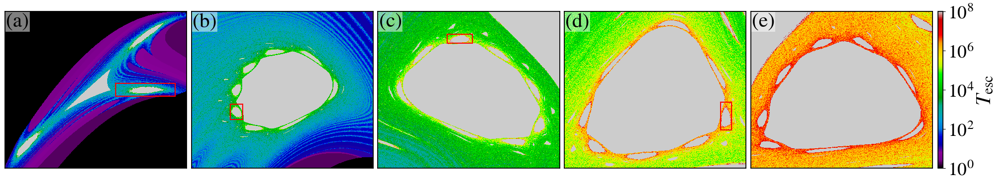

In [ ]:
plot_params(fontsize=30, tick_labelsize=27)
xbox = 0.0065
ybox = 0.903
bbox = {'linewidth': 0.0, 'facecolor': 'white', 'alpha': 0.5, 'pad': 1}
fig, ax = plt.subplots(1, 5, figsize=(20, 3.5))
for l in range(len(xlims)):
    datafile = path + "escape_times_%i.dat" % (l + 1)
    df = pd.read_csv(datafile, header=None, delim_whitespace=True)
    x = np.array(df[0])
    y = np.array(df[1])
    esct = np.array(df[2])
    M = int(np.sqrt(len(x)))
    x = x.reshape((M, M))
    y = y.reshape((M, M))
    esct = esct.reshape((M, M))
    hm = ax[l].pcolor(x, y, np.log10(esct), cmap="nipy_spectral", vmin=0, vmax=8)
    if l != len(xlims) - 1:
        ax[l].plot([xlims[l + 1][0], xlims[l + 1][1]], [ylims[l + 1][0], ylims[l + 1][0]], "r")
        ax[l].plot([xlims[l + 1][1], xlims[l + 1][1]], [ylims[l + 1][0], ylims[l + 1][1]], "r")
        ax[l].plot([xlims[l + 1][0], xlims[l + 1][1]], [ylims[l + 1][1], ylims[l + 1][1]], "r")
        ax[l].plot([xlims[l + 1][0], xlims[l + 1][0]], [ylims[l + 1][0], ylims[l + 1][1]], "r")
    ax[l].set_xticks([])
    ax[l].set_yticks([])
    ax[l].text(xbox, ybox, '(%s)' % ascii_lowercase[l], transform=ax[l].transAxes, bbox=bbox)
cbar_ax = fig.add_axes([0.9425, 0.04, 0.005, 0.945-0.04])
cbar = fig.colorbar(hm, cax=cbar_ax, label='$T_{\\mathrm{esc}}$', ticks=[0, 2, 4, 6, 8])
cbar.ax.set_yticklabels(["$10^0$", "$10^2$", "$10^4$", "$10^6$", "$10^8$"])
plt.subplots_adjust(left=0.0025, bottom=0.04, right=0.937, top=0.945, wspace=0.025)
plt.savefig("Figures/stdmap_escape_times.png", dpi=500)

## Recurrence plots

### Recurrence matrix

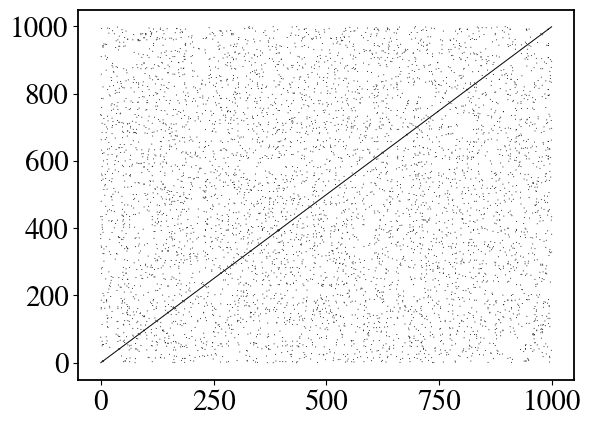

In [9]:
mean = 0
std = 1 
num_samples = 1000
np.random.seed(13)
x = np.random.normal(mean, std, size=num_samples)
rp = RP(x, metric="supremum", normalize=False, threshold_std=1/100, silence_level=2)
recmat1 = rp.recurrence_matrix()
i1 = np.where(recmat1 == 1)[0]
j1 = np.where(recmat1 == 1)[1]
plt.scatter(i1, j1, c='k', s=0.5, edgecolors="none")

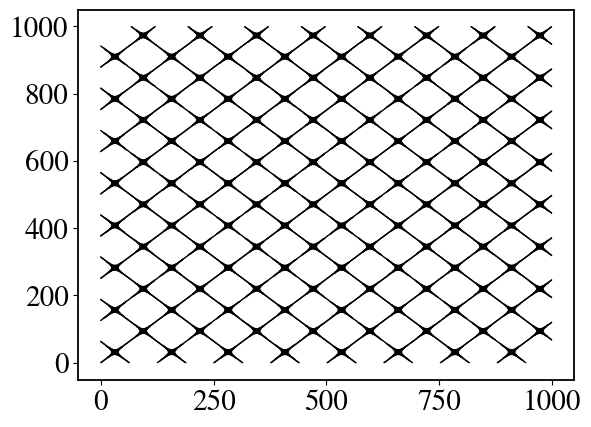

In [10]:
mean = 0
std = 1 
num_samples = 1000
t = np.linspace(0, 50, num_samples)
x = np.sin(t)
rp = RP(x, metric="supremum", normalize=False, threshold_std=10/100, silence_level=2)
recmat2 = rp.recurrence_matrix()
i2 = np.where(recmat2 == 1)[0]
j2 = np.where(recmat2 == 1)[1]
plt.scatter(i2, j2, c='k', s=0.5, edgecolors="none")

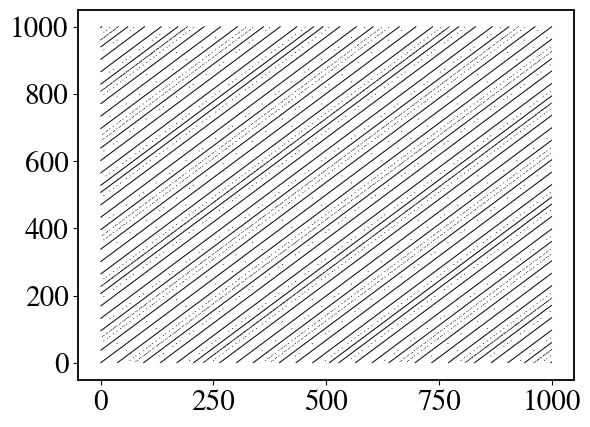

In [11]:
num_samples = 1000
k = 1.5
x = 1.0
y = 0.0
ts = time_series_stdmap(x, y, k, num_samples)
std = max(np.std(ts[:, 0]), np.std(ts[:, 1]))
eps = std*(10/100)
rp = RP(ts, metric="supremum", normalize=False, threshold=eps, silence_level=2)
recmat3 = rp.recurrence_matrix()
i3 = np.where(recmat3 == 1)[0]
j3 = np.where(recmat3 == 1)[1]
plt.scatter(i3, j3, c='k', s=0.5, edgecolors="none")

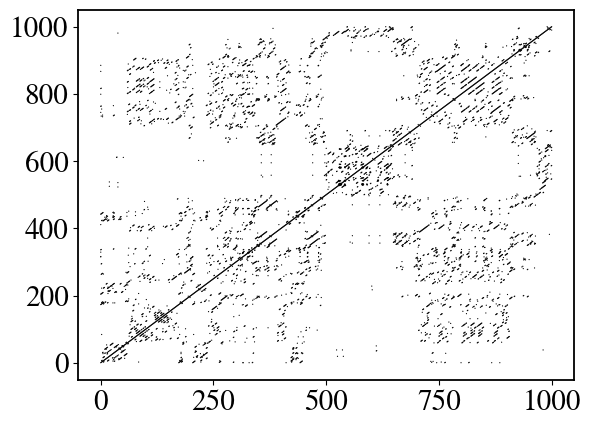

In [12]:
num_samples = 1000
k = 1.5
x = 2.85
y = 0.
ts = time_series_stdmap(x, y, k, num_samples)
std = max(np.std(ts[:, 0]), np.std(ts[:, 1]))
eps = std*(10/100)
rp = RP(ts, metric="supremum", normalize=False, threshold=eps, silence_level=2)
recmat4 = rp.recurrence_matrix()
i4 = np.where(recmat4 == 1)[0]
j4 = np.where(recmat4 == 1)[1]
plt.scatter(i4, j4, c='k', s=0.75, edgecolors="none")

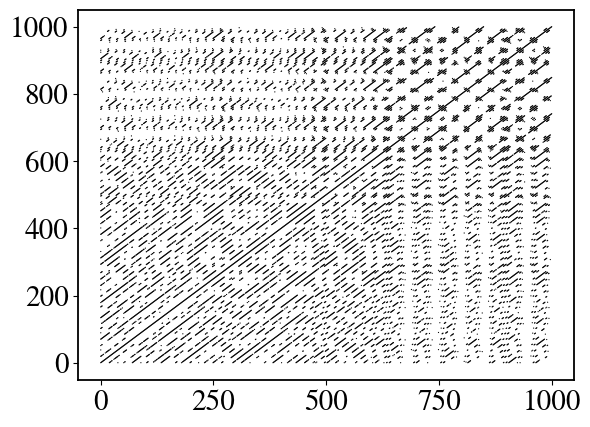

In [13]:
num_samples = 1000
k = 1.5
x = 1.6
y = 0.
ts = time_series_stdmap(x, y, k, num_samples)
std = max(np.std(ts[:, 0]), np.std(ts[:, 1]))
eps = std*(10/100)
rp = RP(ts, metric="supremum", normalize=False, threshold=eps, silence_level=2)
recmat5 = rp.recurrence_matrix()
i5 = np.where(recmat5 == 1)[0]
j5 = np.where(recmat5 == 1)[1]
plt.scatter(i5, j5, c='k', s=0.75, edgecolors="none")

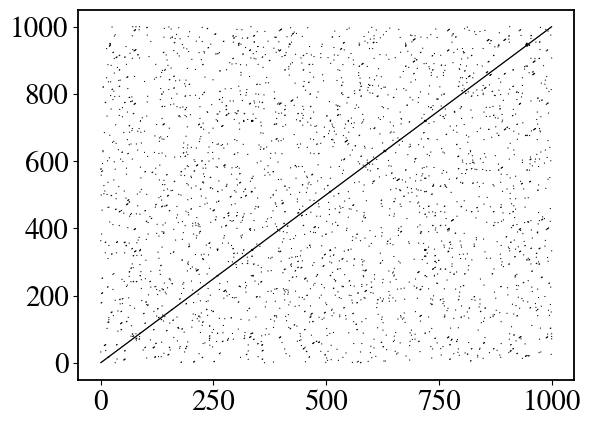

In [14]:
num_samples = 1000
k = 9.0
x = 3
y = 0.
ts = time_series_stdmap(x, y, k, num_samples)
std = max(np.std(ts[:, 0]), np.std(ts[:, 1]))
eps = std*(10/100)
rp = RP(ts, metric="supremum", normalize=False, threshold=eps, silence_level=2)
recmat6 = rp.recurrence_matrix()
i6 = np.where(recmat6 == 1)[0]
j6 = np.where(recmat6 == 1)[1]
plt.scatter(i6, j6, c='k', s=0.75, edgecolors="none")

<Figure size 640x480 with 0 Axes>

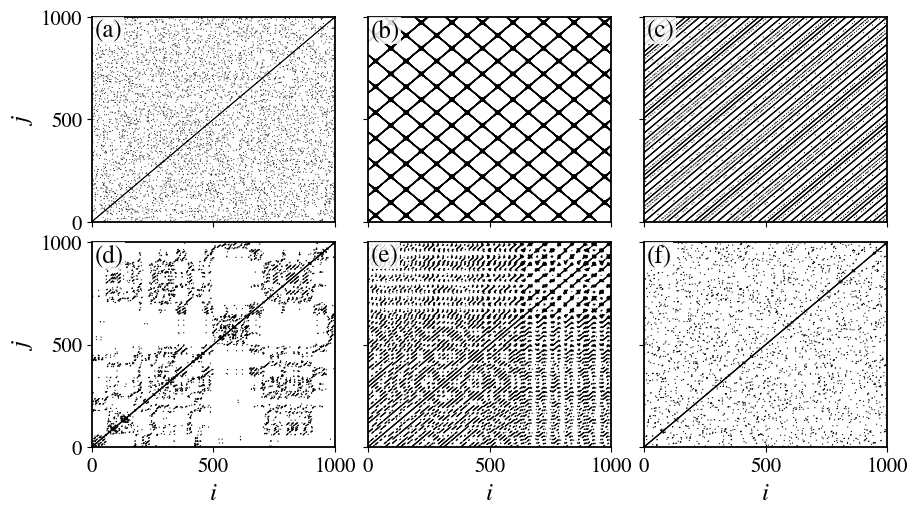

In [36]:
plot_params(fontsize=18, tick_labelsize=15)
fig, ax = plt.subplots(2, 3, sharex=True, sharey=True, figsize=(9,5))
xbox = 0.0105
ybox = 0.9035
bbox = {'linewidth': 0.0, 'facecolor': 'white', 'alpha': 0.85, 'pad': 1}
ax[0, 0].scatter(i1, j1, c='k', s=0.5, edgecolors="none")
ax[0, 1].scatter(i2, j2, c='k', s=0.75, edgecolors="none")
ax[0, 2].scatter(i3, j3, c='k', s=0.75, edgecolors="none")
ax[1, 0].scatter(i4, j4, c='k', s=0.75, edgecolors="none")
ax[1, 1].scatter(i5, j5, c='k', s=0.75, edgecolors="none")
ax[1, 2].scatter(i6, j6, c='k', s=0.75, edgecolors="none")
ax[0, 0].set_xlim(0, 1000)
ax[0, 0].set_ylim(0, 1000)
ax[0, 0].set_ylabel("$j$")
ax[1, 0].set_ylabel("$j$")
ax[0, 0].set_yticks([0, 500, 1000])
ax[0, 0].set_xticks([0, 500, 1000])
for l in range(3):
    ax[1, l].set_xlabel("$i$")
for l in range(6):
    ax[int(l / 3), l % 3].text(xbox, ybox, '(%s)' % ascii_lowercase[l], transform=ax[int(l / 3), l % 3].transAxes, bbox=bbox)
plt.subplots_adjust(left=0.09, bottom=0.11, right=0.974, top=0.97, wspace=0.135, hspace=0.1)
plt.savefig("Figures/ex_recmats.png", dpi=500)

(0.0001390611046580021, -0.00013906110465799858, 5.715274156719773, 4.902162480287238)
(0.43214354206081645, -0.43214354206081657, 2.315823897637854, 0.19502209261764247)
(0.327621700507226, -0.32762170050722605, 1.535676644268296, 5.51581430278894)


<Figure size 640x480 with 0 Axes>

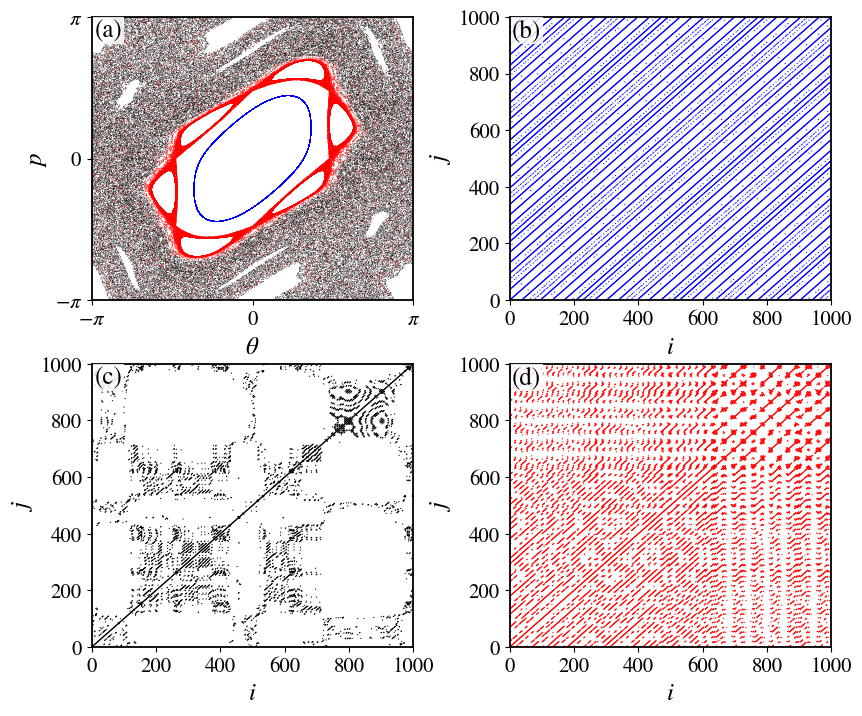

In [22]:
N = int(1.0e5)
x0 = [1.0, 2.9, 1.6]
y0 = [0.0, 0.0, 0.0]
colors = ["blue", "black", "red"]
k = 1.5
xbox = 0.0077
ybox = 0.93
bbox = {'linewidth': 0.0, 'facecolor': 'white', 'alpha': 0.85, 'pad': 1}
plot_params(fontsize=18, tick_labelsize=15)
fig, ax = plt.subplots(2, 2, figsize=(8.5, 7))
for i in range(len(x0)):
    ts = time_series_stdmap(x0[i], y0[i], k, N)
    ax[0, 0].scatter(ts[:, 0], ts[:, 1], c=colors[i], s=0.2, edgecolors="none")
    j = i + 1
    std = max(np.std(ts[:, 0]), np.std(ts[:, 1]))
    eps = std*(10/100)
    rp = RP(ts[:1000, :], metric="supremum", normalize=False, threshold=eps, silence_level=2)
    recmat = rp.recurrence_matrix()
    ii = np.where(recmat == 1)[0]
    jj = np.where(recmat == 1)[1]
    ax[int(j / 2), j % 2].scatter(ii, jj, c=colors[i], s=0.75, edgecolors="none")
    ax[int(j / 2), j % 2].set_xlim(0, 1000)
    ax[int(j / 2), j % 2].set_ylim(0, 1000)
    ax[int(j / 2), j % 2].set_xlabel("$i$")
    ax[int(j / 2), j % 2].set_ylabel("$j$")
    ax[int(j / 2), j % 2].text(xbox, ybox, '(%s)' % ascii_lowercase[j], transform=ax[int(j / 2), j % 2].transAxes, bbox=bbox)
    print(lyapunov(x0[i], y0[i], k, N))
ax[0, 0].text(xbox, ybox, '(%s)' % ascii_lowercase[0], transform=ax[0, 0].transAxes, bbox=bbox)
ax[0, 0].set_xlim(-np.pi, np.pi)
ax[0, 0].set_ylim(-np.pi, np.pi)
ax[0, 0].set_xticks([-np.pi, 0, np.pi])
ax[0, 0].set_yticks([-np.pi, 0, np.pi])
ax[0, 0].set_xticklabels(["$-\\pi$", "$0$", "$\\pi$"])
ax[0, 0].set_yticklabels(["$-\\pi$", "$0$", "$\\pi$"])
ax[0, 0].set_xlabel("$\\theta$")
ax[0, 0].set_ylabel("$p$")
plt.subplots_adjust(left=0.1, bottom=0.08, right=0.97, top=0.98, hspace=0.225, wspace=0.3)
plt.savefig("Figures/stdmap_recmats.png", dpi=500)

In [43]:
print(lyapunov(3.0, 0.0, 9.0, int(1e5)))

(2.1849604647660246, -2.184960464766024, 1.1435623987804298, 0.823073344046287)


### Slater's theorem

In [18]:
@njit
def unique_rec_times(x, y, k, N):
    x0 = x
    y0 = y
    time_series = time_series_stdmap(x, y, k, N)
    std = max(np.std(time_series[:, 0]), np.std(time_series[:, 1]))
    eps = (10/100)*std
    count = 0
    rec_times = []
    for i in range(1, len(time_series[:, 0])):
        count += 1
        if time_series[i, 0] > x0 - eps/2 and time_series[i, 0] < x0 + eps/2 and time_series[i, 1] > y0 - eps/2 and time_series[i, 1] < y0 + eps/2:
            rec_times.append(count)
            count = 0

    return len(set(rec_times))

In [66]:
k = 1.5
L = 1000
N = int(2e6)
x = np.linspace(-np.pi, np.pi, L, endpoint=True)
y = np.linspace(-np.pi, np.pi, L, endpoint=True)
x, y = np.meshgrid(x, y)

In [67]:
urt = Parallel(n_jobs=-1)(delayed(unique_rec_times)(x[i, j], y[i, j], k, N) for i in range(L) for j in range(L))

In [68]:
URT = np.log10(np.array(urt)).reshape((L, L))

/tmp/ipykernel_35701/2968679327.py:1: RuntimeWarning: divide by zero encountered in log10
  URT = np.log10(np.array(urt)).reshape((L, L))


<Figure size 640x480 with 0 Axes>

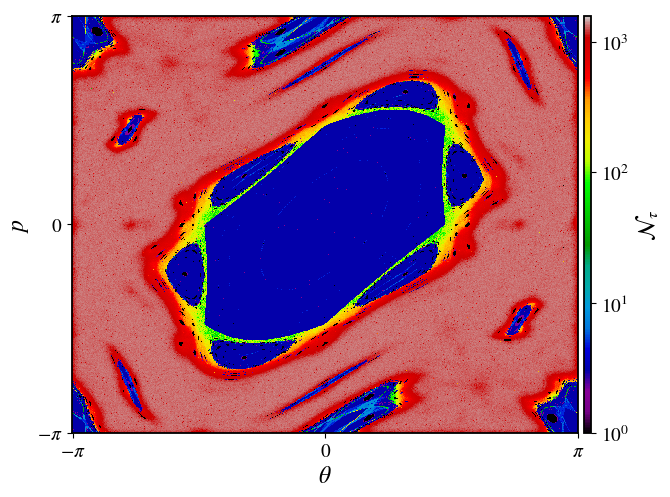

In [75]:
plot_params(fontsize=17, tick_labelsize=14)
fig, ax = plt.subplots()
hm = plt.pcolor(x, y, URT, cmap="nipy_spectral", vmin=0, vmax=3.2)
plt.xticks([-np.pi, 0, np.pi], ["$-\\pi$", "$0$", "$\\pi$"])
plt.yticks([-np.pi, 0, np.pi], ["$-\\pi$", "$0$", "$\\pi$"])
plt.xlabel("$\\theta$")
plt.ylabel("$p$")
cbar_ax = fig.add_axes([0.89, 0.11, 0.01, 0.98-0.11])
cbar = fig.colorbar(hm, cax=cbar_ax, label='$\\mathcal{N}_\\tau$', ticks=[0, 1, 2, 3])
cbar.ax.set_yticklabels(["$10^0$", "$10^1$", "$10^2$", "$10^3$"])
plt.subplots_adjust(left=0.09, bottom=0.11, right = 0.88, top=0.98)
plt.savefig("Figures/slaterstheorem.png", dpi=500)

### RQAs

In [22]:
N = 5000
L = 5000
k = np.linspace(0, 5, L, endpoint=True)
x0 = 0.0
y0 = 1.3
path = "/home/matheus/Doutorado/Tese/Dados/"
datafile = path + "RQAs_N=%i_L=%i_x0=%.1f_y0=%.1f.dat" % (N, L, x0, y0)
df = open(datafile, "w")
lyap = np.zeros(L)
rr = np.zeros(L)
det = np.zeros(L)
ratio = np.zeros(L)
Lmean = np.zeros(L)
Lmax = np.zeros(L)
Sd = np.zeros(L)
lam = np.zeros(L)
tt = np.zeros(L)
vmax = np.zeros(L)
Sv = np.zeros(L)
rte = np.zeros(L)
for i in range(L):
    lyap[i], _, _, _ = lyapunov(x0, y0, k[i], N)
    ts = time_series_stdmap(x0, y0, k[i], L)
    std = max(np.std(ts[:, 0]), np.std(ts[:, 1]))
    eps = std*(10/100)
    rp = RP(ts, metric="supremum", normalize=False, threshold=eps, silence_level=2)
    rr[i] = rp.recurrence_rate()
    det[i] = rp.determinism()
    ratio[i] = det[i]/rr[i]
    Lmean[i] = rp.average_diaglength()
    Lmax[i] = rp.max_diaglength()
    Sd[i] = rp.diag_entropy()
    lam[i] = rp.laminarity()
    tt[i] = rp.trapping_time()
    vmax[i] = rp.max_vertlength()
    Sv[i] = rp.vert_entropy()
    rte[i] = RTE(x0, y0, k[i], N)
    df.write("%.16f %.16f %.16f %.16f %.16f %.16f %.16f %.16f %.16f %.16f %.16f %.16f %.16f\n" % (k[i], lyap[i], rr[i], det[i], ratio[i], Lmean[i], Lmax[i], Sd[i], lam[i], tt[i], vmax[i], Sv[i], rte[i]))
df.close()

<Figure size 640x480 with 0 Axes>

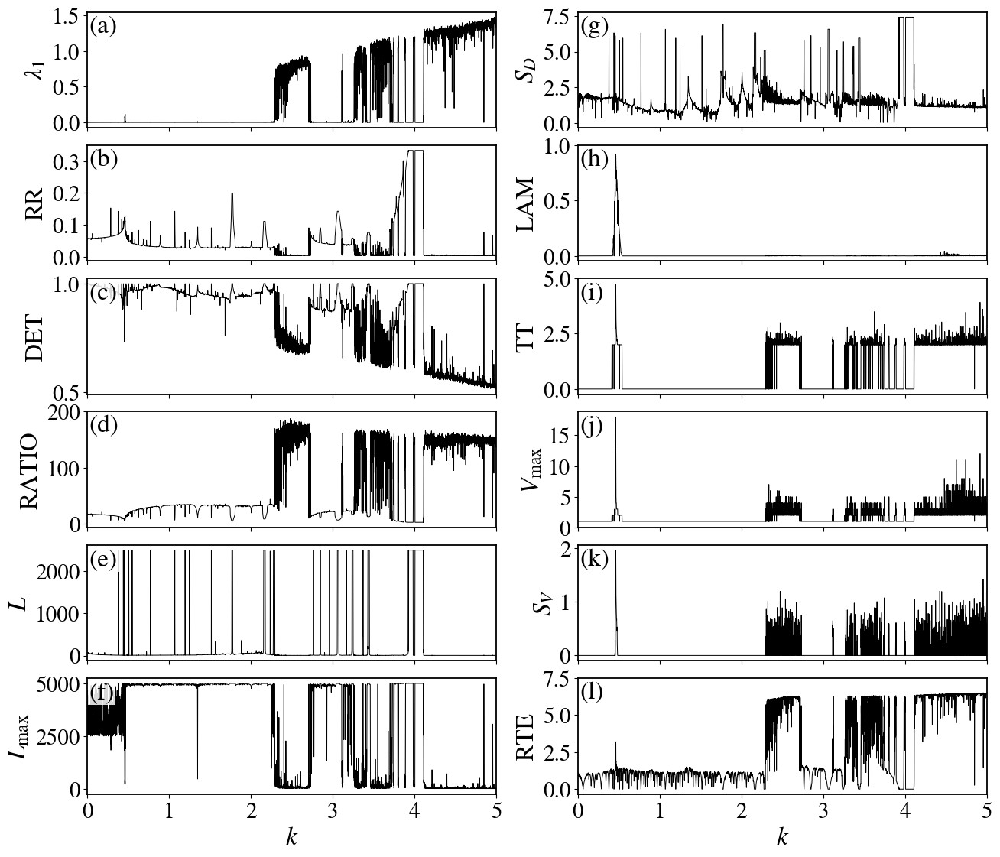

In [63]:
xbox = 0.0045
ybox = 0.825
bbox = {'linewidth': 0.0, 'facecolor': 'white', 'alpha': 0.85, 'pad': 1}
plot_params(fontsize=24, tick_labelsize=21)
lw = 0.7
fig, ax = plt.subplots(6, 2, sharex=True, figsize=(13,11))
ax[0, 0].set_xlim(k.min(), 5)
ax[0, 0].set_xticks([0, 1, 2, 3, 4, 5])
ax[-1, 0].set_xlabel("$k$")
ax[-1, 1].set_xlabel("$k$")
ax[0, 0].plot(k, lyap, "k", lw = lw)
ax[0, 0].set_ylabel("$\\lambda_1$")
ax[0, 0].set_yticks([0, 0.5, 1, 1.5])

ax[1, 0].plot(k, rr, "k", lw = lw)
ax[1, 0].set_ylabel("RR")
ax[1, 0].set_yticks([0, 0.1, 0.2, 0.3])

ax[2, 0].plot(k, det, "k", lw = lw)
ax[2, 0].set_ylabel("DET")
ax[2, 0].set_yticks([0.5, 1])

ax[3, 0].plot(k, ratio, "k", lw = lw)
ax[3, 0].set_ylabel("RATIO")
ax[3, 0].set_yticks([0, 100, 200])

ax[4, 0].plot(k, Lmean, "k", lw = lw)
ax[4, 0].set_ylabel("$L$")
ax[4, 0].set_yticks([0, 1000, 2000])

ax[5, 0].plot(k, Lmax, "k", lw = lw)
ax[5, 0].set_ylabel("$L_{\\mathrm{max}}$")
ax[5, 0].set_yticks([0, 2500, 5000])

ax[0, 1].plot(k, Sd, "k", lw = lw)
ax[0, 1].set_ylabel("$S_D$")
ax[0, 1].set_yticks([0, 2.5, 5, 7.5])

ax[1, 1].plot(k, lam, "k", lw = lw)
ax[1, 1].set_ylabel("LAM")
ax[1, 1].set_yticks([0, 0.5, 1])

ax[2, 1].plot(k, tt, "k", lw = lw)
ax[2, 1].set_ylabel("TT")
ax[2, 1].set_yticks([0, 2.5, 5])

ax[3, 1].plot(k, vmax, "k", lw = lw)
ax[3, 1].set_ylabel("$V_{\\mathrm{max}}$")
ax[3, 1].set_yticks([0, 5, 10, 15])

ax[4, 1].plot(k, Sv, "k", lw = lw)
ax[4, 1].set_ylabel("$S_V$")
ax[4, 1].set_yticks([0, 1, 2])

ax[5, 1].plot(k, rte, "k", lw = lw)
ax[5, 1].set_ylabel("RTE")
ax[5, 1].set_yticks([0, 2.5, 5, 7.5])

for i in range(12):
    ax[i % 6, int(i / 6)].text(xbox, ybox, '(%s)' % ascii_lowercase[i], transform=ax[i % 6, int(i / 6)].transAxes, bbox=bbox)

plt.subplots_adjust(left=0.085, bottom=0.06, right=0.99, top=0.99, hspace=0.15)
plt.savefig("Figures/rqas.png", dpi=500)


In [64]:
cc = np.zeros(11)
cc[0] = corr_coef(lyap, rr)
cc[1] = corr_coef(lyap, det)
cc[2] = corr_coef(lyap, ratio)
cc[3] = corr_coef(lyap, Lmean)
cc[4] = corr_coef(lyap, Lmax)
cc[5] = corr_coef(lyap, Sd)
cc[6] = corr_coef(lyap, lam)
cc[7] = corr_coef(lyap, tt)
cc[8] = corr_coef(lyap, vmax)
cc[9] = corr_coef(lyap, Sv)
cc[10] = corr_coef(lyap, rte)
for i in range(len(cc)):
    print("%.2f" % cc[i])

-0.43
-0.96
0.92
-0.19
-0.91
-0.21
-0.07
0.89
0.70
0.48
0.95


### Grid RTE

In [3]:
x_ini = [-np.pi, -np.pi, -1.5, -1.5, 0.8, 0.83]
x_end = [np.pi, np.pi, 1.5, 1.5, 1.6, 1.47]
y_ini = [-np.pi, -np.pi, -2.5, -2.5, 1.8, -0.6]
y_end = [np.pi, np.pi, 2.5, 2.5, 3.0, 0.6]
L = 1000
x = np.linspace(x_ini, x_end, L)
y = np.linspace(y_ini, y_end, L)
x, y = np.meshgrid(x, y)
ks = np.array([0.9, 1.5, 3.63, 4.0, 5.3, 6.908745])
N = int(5000)

In [41]:
path = "/home/matheus/Doutorado/Tese/Dados/"
for l in range(0, 2):
    k = ks[l]
    x = np.linspace(x_ini[l], x_end[l], L)
    y = np.linspace(y_ini[l], y_end[l], L)
    x, y = np.meshgrid(x, y)
    rte = Parallel(n_jobs=-1)(delayed(RTE)(x[i, j], y[i, j], k, N) for i in range(L) for j in range(L))
    rte = np.array(rte).reshape((L, L))
    with open(path + "RTE_grid_L=%i_k=%.6f.dat" % (L, k), "w") as df:
        for i in range(L):
            for j in range(L):
                df.write("%.16f %.16f %.16f\n" % (x[i, j], y[i, j], rte[i, j]))
            df.write("\n")

KeyboardInterrupt: 

<Figure size 640x480 with 0 Axes>

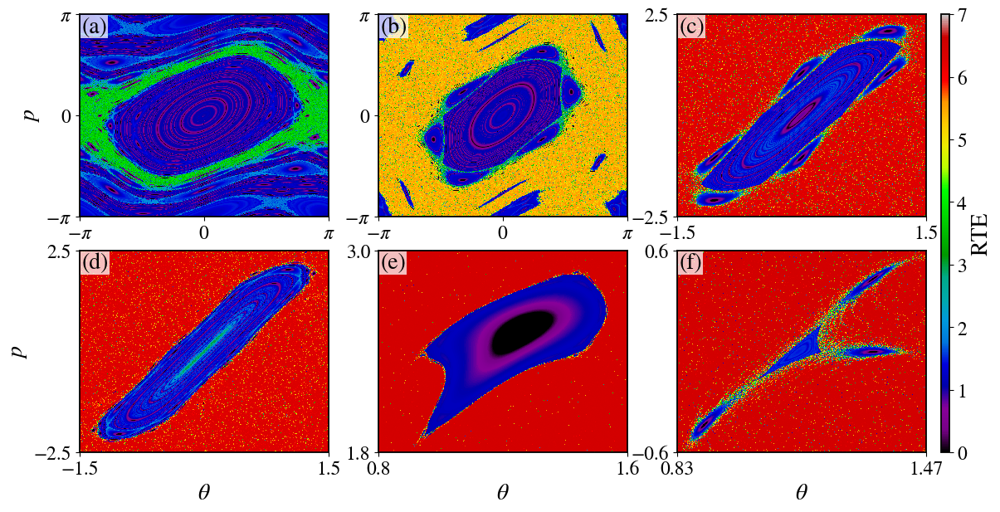

In [4]:
path = "/home/matheus/Doutorado/Tese/Dados/"
plot_params()
xbox = 0.0077
ybox = 0.912
bbox = {'linewidth': 0.0, 'facecolor': 'white', 'alpha': 0.75, 'pad': 1}
fig, ax = plt.subplots(2, 3, figsize=(12, 6))
for i, k in enumerate(ks):
    df = path + "RTE_grid_L=%i_k=%.6f.dat" % (L, k)
    df = pd.read_csv(df, header=None, delim_whitespace=True)
    x = np.array(df[0])
    y = np.array(df[1])
    rte = np.array(df[2])
    M = int(np.sqrt(len(rte)))
    x = x.reshape((M, M))
    y = y.reshape((M, M))
    rte = rte.reshape((M, M))
    hm = ax[int(i / 3), i % 3].pcolor(x, y, rte, vmin=0, vmax=7, cmap="nipy_spectral")
    ax[int(i / 3), i % 3].text(xbox, ybox, '(%s)' % ascii_lowercase[i], transform=ax[int(i / 3), i % 3].transAxes, bbox=bbox)
    ax[int(i / 3), i % 3].set_xlim(x_ini[i], x_end[i]), ax[int(i / 3), i % 3].set_ylim(y_ini[i], y_end[i])
    if i == 0 or i == 1:
        ax[int(i / 3), i % 3].set_xticks([-np.pi, 0, np.pi]), ax[int(i / 3), i % 3].set_yticks([-np.pi, 0, np.pi])
        ax[int(i / 3), i % 3].set_xticklabels(["$-\\pi$", "$0$", "$\\pi$"]), ax[int(i / 3), i % 3].set_yticklabels(["$-\\pi$", "$0$", "$\\pi$"])
    else:
        ax[int(i / 3), i % 3].set_xticks([x_ini[i], x_end[i]]), ax[int(i / 3), i % 3].set_yticks([y_ini[i], y_end[i]])
ax[0, 0].set_ylabel("$p$"), ax[1, 0].set_ylabel("$p$")
ax[1, 0].set_xlabel("$\\theta$"), ax[1, 1].set_xlabel("$\\theta$"), ax[1, 2].set_xlabel("$\\theta$")
cbar_ax = fig.add_axes([0.935, 0.1, 0.008, 0.98-0.1])
cbar = fig.colorbar(hm, cax=cbar_ax, label='RTE')
plt.subplots_adjust(left=0.07, bottom=0.1, right=0.92, top=0.98, hspace=0.17, wspace=0.20)
plt.savefig("Figures/stdmap_rte_grid.png", dpi=300)

### Zoom for $k = 1.5$

<Figure size 640x480 with 0 Axes>

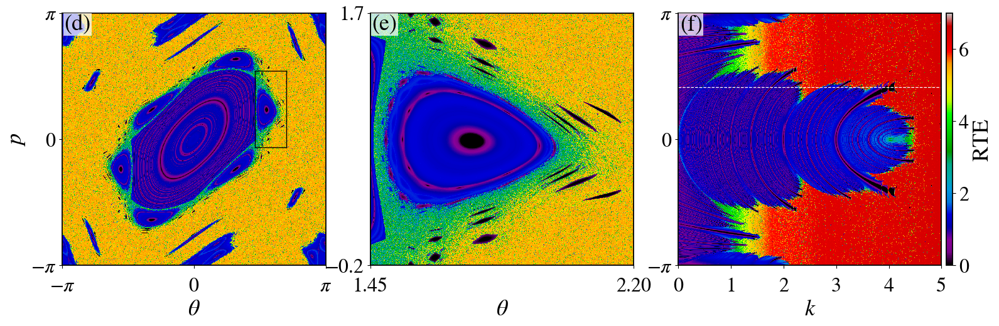

In [7]:
plot_params(fontsize=26, tick_labelsize=23)
xbox = 0.00625
ybox = 0.93225
bbox = {'linewidth': 0.0, 'facecolor': 'white', 'alpha': 0.75, 'pad': 1}
label = 'abc'
xl = ['x', 'x', 'k']
fig, ax = plt.subplots(1, 3, facecolor='w', figsize=(16, 5))
datafile = "/home/matheus/Doutorado/Tese/Dados/RTE_grid_L=1000_k=1.500000.dat"
df = pd.read_csv(datafile, delim_whitespace=True, header=None)
x = np.array(df[0])
y = np.array(df[1])
z = np.array(df[2])
M = int(np.sqrt(len(x)))
x = x.reshape((M, M))
y = y.reshape((M, M))
z = z.reshape((M, M))
hm = ax[0].pcolor(x, y, z, vmin=0, vmax=7, shading='auto', cmap="nipy_spectral")
ax[0].set_xlim(x.min(), x.max())
ax[0].set_ylim(y.min(), y.max())
ax[0].text(xbox, ybox, '(d)', transform=ax[0].transAxes, bbox=bbox)
ax[0].set_xticks([-np.pi, 0, np.pi]), ax[0].set_yticks([-np.pi, 0, np.pi])
ax[0].set_xticklabels(['$-\\pi$', '$0$', '$\\pi$']), ax[0].set_yticklabels(['$-\\pi$', '$0$', '$\\pi$'])
ax[0].tick_params(axis='x', which='major', pad=10)
ax[0].set_ylabel('$p$')
LW = 1
aux = "k-"
ax[0].plot([1.45, 2.2], [-0.2, -0.2], aux, lw=LW)
ax[0].plot([2.2, 2.2], [-0.2, 1.7], aux, lw=LW)
ax[0].plot([1.45, 2.2], [1.7, 1.7], aux, lw=LW)
ax[0].plot([1.45, 1.45], [1.7, -0.2], aux, lw=LW)
ax[0].set_xlabel("$\\theta$")
###################################################
datafile = "/home/matheus/Doutorado/Tese/Dados/RTE_grid_L=1000_k=1.500000_zoom.dat"
df = pd.read_csv(datafile, delim_whitespace=True, header=None)
x = np.array(df[0])
y = np.array(df[1])
z = np.array(df[2])
M = int(np.sqrt(len(x)))
x = x.reshape((M, M))
y = y.reshape((M, M))
z = z.reshape((M, M))
hm = ax[1].pcolor(x, y, z, vmin=0, vmax=7, shading='auto', cmap="nipy_spectral")
ax[1].set_xlim(x.min(), x.max())
ax[1].set_ylim(y.min(), y.max())
ax[1].text(xbox, ybox, '(e)', transform=ax[1].transAxes, bbox=bbox)
ax[1].set_xticks([x.min(), x.max()]), ax[1].set_yticks([y.min(), y.max()])
ax[1].tick_params(axis='x', which='major', pad=10)
ax[1].set_xlabel("$\\theta$")
###################################################
datafile = "/home/matheus/Doutorado/Tese/Dados/RTE_CGBD_L=1000_x0=0.000000.dat"
df = pd.read_csv(datafile, delim_whitespace=True, header=None)
x = np.array(df[0])
y = np.array(df[1])
z = np.array(df[2])
M = int(np.sqrt(len(x)))
x = x.reshape((M, M))
y = y.reshape((M, M))
z = z.reshape((M, M))
hm = ax[2].pcolor(x, y, z, vmin=0, vmax=7, shading='auto', cmap="nipy_spectral")
ax[2].set_xlim(x.min(), x.max())
ax[2].set_ylim(y.min(), y.max())
ax[2].text(xbox, ybox, '(f)', transform=ax[2].transAxes, bbox=bbox)
ax[2].tick_params(axis='x', which='major', pad=10)
ax[2].set_xlabel("$k$")
ax[2].set_yticks([-np.pi, 0, np.pi])
ax[2].set_yticklabels(["$-\\pi$", "$0$", "$\\pi$"])
ax[2].set_xticks([0, 1, 2, 3, 4, 5])

ax[-1].plot([0, 5], [1.3, 1.3], 'w--', lw=0.9)
ax[2].set_xlabel("$k$")

cbar_ax = fig.add_axes([0.935, 0.165, 0.006, 0.97-0.165])
cbar = fig.colorbar(hm, cax=cbar_ax, label='RTE')
plt.subplots_adjust(left=0.055, bottom=0.165, right=0.93, top=0.97, wspace=0.17)
plt.savefig("Figures/stdmap_RTE_zoom.png", dpi=300)

### Finite-time RTE

#### $N = 10^{10}$

In [4]:
k = 1.5
Ntot = int(1e10)
exponent = int(np.log10(Ntot))
base = int(Ntot/10**exponent)
n = 200
N = round(Ntot/n)
x0 = -3.0
p0 = 0.0
# Fig 5bc - blue
s01a = 0.6
sf1a = 0.8
# Fig 5bc - red
s01b = 1.25
sf1b = 1.33
# Fig 5bc - green
s01c = sf1b
sf1c = 1.48
# Fig 5bc - black
s02 = sf1c
sf2 = 1.55
# Fig 6a - black
s03 = 2.5
sf3 = 4

In [ ]:
ftrte1 = FTRTE(x0, p0, k, n, Ntot)
path = "/home/matheus/Doutorado/Tese/Dados/"
datafile = path + 'FTRTE_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
np.savetxt(datafile, ftrte1)

#### $N = 10^8$

In [ ]:
# Name of the files
Ntot = int(1e8)
n = 200
N = round(Ntot/n)
exponent = int(np.log10(Ntot))
base = int(Ntot/10**exponent)
path = "/home/matheus/Doutorado/Tese/Dados/"
datafile1a = path + 'FTRTE_blue_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
datafile1b = path + 'FTRTE_red_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
datafile1c = path + 'FTRTE_green_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
datafile2 = path + 'FTRTE_black_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
datafile3 = path + 'FTRTE2_black_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
# Opens the files
df1a = open(datafile1a, 'w')
df1b = open(datafile1b, 'w')
df1c = open(datafile1c, 'w')
df2 = open(datafile2, 'w')
df3 = open(datafile3, 'w')
# Sets the initial condtion and iterates the orbit
x = x0
p = p0
for i in range(N):
    # Gets the phase-space positions
    ts = time_series_stdmap(x, p, k, n)
    X = ts[:, 0]
    P = ts[:, 1]
    # Evaluate the RTE for the (x, p) IC
    ftrte, x, p = RTE(x, p, k, n, return_last_pos=True)
    # Checks if RTE is on the intervals defined above. If so,
    # writes its phase-space positions to the corresponding file
    if ftrte >= s01a and ftrte <= sf1a:
        for j in range(n):
            df1a.write('%.16f %.16f\n' % (X[j], P[j]))
    elif ftrte > s01b and ftrte <= sf1b:
        for j in range(n):
            df1b.write('%.16f %.16f\n' % (X[j], P[j]))
    elif ftrte > s01c and ftrte <= sf1c:
        for j in range(n):
            df1c.write('%.16f %.16f\n' % (X[j], P[j]))
    elif ftrte >= s02 and ftrte <= sf2:
        for j in range(n):
            df2.write('%.16f %.16f\n' % (X[j], P[j]))
    elif ftrte >= s03 and ftrte <= sf3 and Ntot == 1e7:
        # Does not save when Ntot = 1e9 due to high number of points
        # Uses Ntot = 1e7 to plot the phase space
        for j in range(n):
            df3.write('%.16f %.16f\n' % (X[j], P[j]))
# Closes the files
df1a.close()
df1b.close()
df1c.close()
df2.close()
df3.close()

#### $N = 10^9$

In [ ]:
# Name of the files
Ntot = int(1e9)
n = 200
N = round(Ntot/n)
exponent = int(np.log10(Ntot))
base = int(Ntot/10**exponent)
path = "/home/matheus/Doutorado/Tese/Dados/"
datafile1a = path + 'FTRTE_blue_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
datafile1b = path + 'FTRTE_red_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
datafile1c = path + 'FTRTE_green_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
datafile2 = path + 'FTRTE_black_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
datafile3 = path + 'FTRTE2_black_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
# Opens the files
df1a = open(datafile1a, 'w')
df1b = open(datafile1b, 'w')
df1c = open(datafile1c, 'w')
df2 = open(datafile2, 'w')
df3 = open(datafile3, 'w')
# Sets the initial condtion and iterates the orbit
x = x0
p = p0
for i in range(N):
    # Gets the phase-space positions
    ts = time_series_stdmap(x, p, k, n)
    X = ts[:, 0]
    P = ts[:, 1]
    # Evaluate the RTE for the (x, p) IC
    ftrte, x, p = RTE(x, p, k, n, return_last_pos=True)
    # Checks if RTE is on the intervals defined above. If so,
    # writes its phase-space positions to the corresponding file
    if ftrte >= s01a and ftrte <= sf1a:
        for j in range(n):
            df1a.write('%.16f %.16f\n' % (X[j], P[j]))
    elif ftrte > s01b and ftrte <= sf1b:
        for j in range(n):
            df1b.write('%.16f %.16f\n' % (X[j], P[j]))
    elif ftrte > s01c and ftrte <= sf1c:
        for j in range(n):
            df1c.write('%.16f %.16f\n' % (X[j], P[j]))
    elif ftrte >= s02 and ftrte <= sf2:
        for j in range(n):
            df2.write('%.16f %.16f\n' % (X[j], P[j]))
    elif ftrte >= s03 and ftrte <= sf3 and Ntot == 1e7:
        # Does not save when Ntot = 1e9 due to high number of points
        # Uses Ntot = 1e7 to plot the phase space
        for j in range(n):
            df3.write('%.16f %.16f\n' % (X[j], P[j]))
# Closes the files
df1a.close()
df1b.close()
df1c.close()
df2.close()
df3.close()

<Figure size 640x480 with 0 Axes>

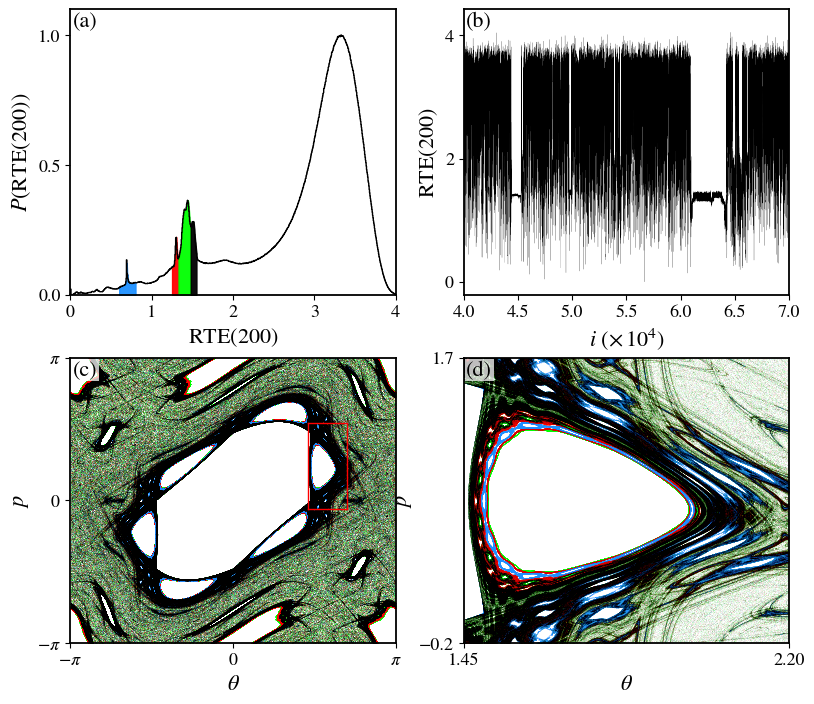

In [6]:
plot_params(fontsize=16, tick_labelsize=13)
xbox = 0.0075
ybox = 0.9385
bbox = {'linewidth': 0.0, 'facecolor': 'white', 'alpha': 0.75, 'pad': 1}
fig, ax = plt.subplots(2, 2, facecolor='w', figsize=(8, 7))
Ntot = int(1e10)
n = 200
exponent = int(np.log10(Ntot))
base = int(Ntot/10**exponent)
path = "/home/matheus/Doutorado/Tese/Dados/"
datafile = path + 'FTRTE_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
df = pd.read_csv(datafile, header=None, delim_whitespace=True)
ftrte1 = np.array(df[0])
bin_heights, bin_borders, _ = ax[0,0].hist(ftrte1, density=True, histtype='step', color='k', bins='auto')
bin_widths = np.diff(bin_borders)
bin_centers = bin_borders[:-1] + bin_widths / 2
x = bin_centers
y = bin_heights
f = interp1d(x, y, kind='cubic')
color1 = 'dodgerblue'
color2 = 'red'
color3 = 'lime'
marker = 'o'
ms = 0.5
ax[0, 0].fill_between(np.linspace(s01a, sf1a), f(np.linspace(s01a, sf1a)), alpha=0.95, color=color1)
ax[0, 0].fill_between(np.linspace(s01b, sf1b), f(np.linspace(s01b, sf1b)), alpha=0.95, color=color2)
ax[0, 0].fill_between(np.linspace(s01c, sf1c), f(np.linspace(s01c, sf1c)), alpha=0.95, color=color3)
ax[0, 0].fill_between(np.linspace(s02, sf2), f(np.linspace(s02, sf2)), alpha=0.95, color='k')
_ = ax[0, 0].set_xlabel('$\\mathrm{RTE}(%i)$' % n), ax[0, 0].set_ylabel('$P(\\mathrm{RTE}(%i))$' % n), ax[0, 0].set_xlim(0, 4), ax[0, 0].set_yticks([0, 0.5, 1]), ax[0, 0].set_ylim(0, 1.1)
ax[0, 0].text(xbox, ybox, '(a)', transform=ax[0, 0].transAxes, bbox=bbox)
ax[0, 0].set_xticks([0, 1, 2, 3, 4])
####################
# --- Fig 5(b) --- #
####################
ii = np.arange(len(ftrte1))/1e4

ax[0, 1].plot(ii, ftrte1, 'k-', lw=0.1)
ax[0, 1].set_xlim(4, 7)
ax[0, 1].set_xlabel('$i$ $(\\times\,10^4)$')
ax[0, 1].set_ylabel('$\\mathrm{RTE}(200)$')
ax[0, 1].set_yticks([0, 2, 4])
ax[0, 1].text(xbox, ybox, '(b)', transform=ax[0, 1].transAxes, bbox=bbox)
####################
# --- Fig 5(c) --- #
####################
ms = ms/2
Ntot = int(1e8)
exponent = int(np.log10(Ntot))
base = int(Ntot/10**exponent)
path = "/home/matheus/Doutorado/Tese/Dados/"
datafile1a = path + 'FTRTE_blue_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
datafile1b = path + 'FTRTE_red_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
datafile1c = path + 'FTRTE_green_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
datafile2 = path + 'FTRTE_black_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
datafile3 = path + 'FTRTE2_black_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
df = pd.read_csv(datafile1c, header=None, delim_whitespace=True)
x = np.array(df[0])
y = np.array(df[1])
ax[1, 0].plot(x, y, marker, c=color3, markersize=ms, markeredgewidth=0)
df = pd.read_csv(datafile1b, header=None, delim_whitespace=True)
x = np.array(df[0])
y = np.array(df[1])
ax[1, 0].plot(x, y, marker, c=color2, markersize=ms, markeredgewidth=0)
df = pd.read_csv(datafile1a, header=None, delim_whitespace=True)
x = np.array(df[0])
y = np.array(df[1])
ax[1, 0].plot(x, y, marker, c=color1, markersize=ms, markeredgewidth=0)
df = pd.read_csv(datafile2, header=None, delim_whitespace=True)
x = np.array(df[0])
y = np.array(df[1])
ax[1, 0].plot(x, y, marker, c='k', markersize=ms, markeredgewidth=0)
_ = ax[1, 0].set_ylabel('$p$')
_ = ax[1, 0].set_xlabel('$\\theta$')
_ = ax[1, 0].set_xlim(-np.pi, np.pi), ax[1, 0].set_ylim(-np.pi, np.pi)
_ = ax[1, 0].set_xticks([-np.pi, 0, np.pi]), ax[1, 0].set_yticks([-np.pi, 0, np.pi])
_ = ax[1, 0].set_xticklabels(['$-\\pi$', '$0$', '$\\pi$']), ax[1, 0].set_yticklabels(['$-\\pi$', '$0$', '$\\pi$'])
ax[1, 0].text(xbox, ybox, '(c)', transform=ax[1, 0].transAxes, bbox=bbox)
LW = 1.
color = 'red'
ax[1, 0].plot([1.45, 2.2], [-0.2, -0.2], '-', c=color, lw=LW)
ax[1, 0].plot([2.2, 2.2], [-0.2, 1.7], '-', c=color, lw=LW)
ax[1, 0].plot([1.45, 2.2], [1.7, 1.7], '-', c=color, lw=LW)
ax[1, 0].plot([1.45, 1.45], [1.7, -0.2], '-', c=color, lw=LW)
####################
# --- Fig 5(d) --- #
####################
ms = ms/2
xi = 1.45
xf = 2.2
yi = -0.2
yf = 1.7
Ntot = int(1e9)
exponent = int(np.log10(Ntot))
base = int(Ntot/10**exponent)
path = "/home/matheus/Doutorado/Tese/Dados/"
datafile1a = path + 'FTRTE_blue_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
datafile1b = path + 'FTRTE_red_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
datafile1c = path + 'FTRTE_green_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
datafile2 = path + 'FTRTE_black_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
datafile3 = path + 'FTRTE2_black_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
df = pd.read_csv(datafile1c, header=None, delim_whitespace=True)
x = np.array(df[0])
y = np.array(df[1])
X = x[np.where((x >= xi) & (x <= xf) & (y >= yi) & (y <= yf))]
Y = y[np.where((x >= xi) & (x <= xf) & (y >= yi) & (y <= yf))]
x = X
y = Y
ax[1, 1].plot(x, y, marker, c=color3, markersize=ms, markeredgewidth=0)

df = pd.read_csv(datafile1b, header=None, delim_whitespace=True)
x = np.array(df[0])
y = np.array(df[1])
X = x[np.where((x >= xi) & (x <= xf) & (y >= yi) & (y <= yf))]
Y = y[np.where((x >= xi) & (x <= xf) & (y >= yi) & (y <= yf))]
x = X
y = Y
ax[1, 1].plot(x, y, marker, c=color2, markersize=ms, markeredgewidth=0)

df = pd.read_csv(datafile1a, header=None, delim_whitespace=True)
x = np.array(df[0])
y = np.array(df[1])
X = x[np.where((x >= xi) & (x <= xf) & (y >= yi) & (y <= yf))]
Y = y[np.where((x >= xi) & (x <= xf) & (y >= yi) & (y <= yf))]
x = X
y = Y
ax[1, 1].plot(x, y, marker, c=color1, markersize=ms, markeredgewidth=0)

df = pd.read_csv(datafile2, header=None, delim_whitespace=True)
x = np.array(df[0])
y = np.array(df[1])
X = x[np.where((x >= xi) & (x <= xf) & (y >= yi) & (y <= yf))]
Y = y[np.where((x >= xi) & (x <= xf) & (y >= yi) & (y <= yf))]
x = X
y = Y
ax[1, 1].plot(x, y, marker, c='k', markersize=ms, markeredgewidth=0)

ax[1, 1].text(xbox, ybox, '(d)', transform=ax[1, 1].transAxes, bbox=bbox)

_ = ax[1, 1].set_xlim(xi, xf), ax[1, 1].set_ylim(yi, yf)
_ = ax[1, 1].set_xticks([xi, xf]), ax[1, 1].set_yticks([yi, yf])
_ = ax[1, 1].set_ylabel('$p$')
_ = ax[1, 1].set_xlabel('$\\theta$')
"""ax[0, 0].tick_params(axis='x', which='major', pad=10)
ax[1].tick_params(axis='x', which='major', pad=10)
ax[2].tick_params(axis='x', which='major', pad=10)"""
plt.subplots_adjust(left=0.08, bottom=0.075, right=0.978, top=0.98, hspace=0.22, wspace=0.21)
plt.savefig("Figures/stdmap_ftrte.png", dpi=500, format='png')

### Finite-time RTE and finite-time Lyapunov exponent

In [3]:
Ntot = int(1e10)
n = 200
exponent = int(np.log10(Ntot))
base = int(Ntot/10**exponent)
path = "/home/matheus/Doutorado/Tese/Dados/"
datafile = path + 'FTRTE_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
df = pd.read_csv(datafile, header=None, delim_whitespace=True)
ftrte1 = np.array(df[0])

In [12]:
Ntot = int(1e10)
n = 200
exponent = int(np.log10(Ntot))
base = int(Ntot/10**exponent)
path = "/home/matheus/Doutorado/Tese/Dados/"
datafile = path + 'FTLE_Ntot=%ie%i_n=%i.dat' % (base, exponent, n)
df = pd.read_csv(datafile, header=None, delim_whitespace=True)
ftle = np.array(df[0])

<Figure size 640x480 with 0 Axes>

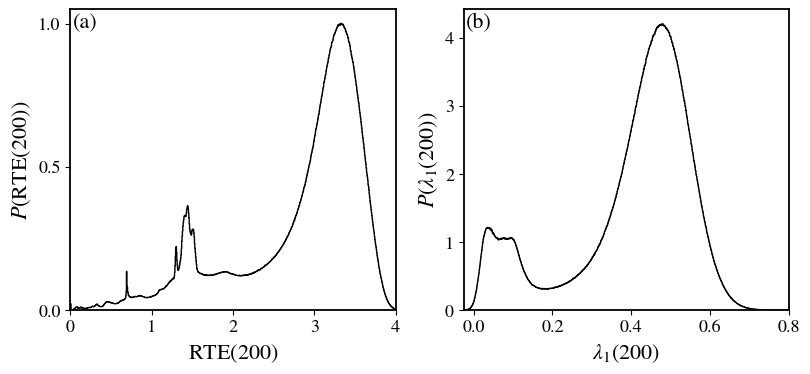

In [24]:
plot_params(fontsize=16, tick_labelsize=13)
xbox = 0.0075
ybox = 0.9385
bbox = {'linewidth': 0.0, 'facecolor': 'white', 'alpha': 0.75, 'pad': 1}
fig, ax = plt.subplots(1, 2, facecolor='w', figsize=(8, 3.6))
ax[0].hist(ftrte1, density=True, histtype='step', color='k', bins='auto')
ax[1].hist(ftle, density=True, histtype='step', color='k', bins='auto')
ms = 0.5
ax[0].set_xlabel('$\\mathrm{RTE}(%i)$' % n), ax[0].set_ylabel('$P(\\mathrm{RTE}(%i))$' % n), ax[0].set_xlim(0, 4), ax[0].set_yticks([0, 0.5, 1]), ax[0].set_ylim(0, 1.05)
ax[1].set_xlabel('$\\lambda_1(%i)$' % n), ax[1].set_ylabel('$P(\\lambda_1(%i))$' % n), ax[1].set_xlim(-0.025, 0.8)
ax[0].text(xbox, ybox, '(a)', transform=ax[0].transAxes, bbox=bbox)
ax[1].text(xbox, ybox, '(b)', transform=ax[1].transAxes, bbox=bbox)
ax[0].set_xticks([0, 1, 2, 3, 4])

plt.subplots_adjust(left=0.08, bottom=0.145, right=0.978, top=0.98, hspace=0.22, wspace=0.21)
plt.savefig("Figures/stdmap_ftRTELE.png", dpi=300, format='png')

### The effect of $\epsilon$ on the RTE

In [28]:
L = 5000
N = 5000
x0 = 0.0
y0 = 1.3
k = np.linspace(0, 5, L, endpoint=True)
std = np.zeros((L, 3))
for i in range(len(k)):
    ts = time_series_stdmap(x0, y0, k[i], L)
    std[i, 0] = np.std(ts)
    std[i, 1] = max(np.std(ts[:, 0]), np.std(ts[:, 1]))
    std[i, 2] = np.sqrt(np.std(ts[:, 0])**2 + np.std(ts[:, 1])**2)
     

In [11]:
# Number of points in k
L = 5000
# Length of the orbit
T = int(5e3)
# Initial condition (IC)
x = 0.0
p = 1.3
# Limits of k
k_ini = 0
k_end = 5
# Creates an array from k_ini to k_end (included) with L points
k = np.linspace(k_ini, k_end, L, endpoint=True)
# 
teps = np.linspace(1/100, 15/100, 29, endpoint=True)

# Obtains the largest Lyapunov exponent for the array above using parallel computing with Numba.
lypnv = [Parallel(n_jobs=-1)(delayed(lyapunov)(x, p, k[l], N) for l in range(len(k)))]

# Obtains the rte for the array above using parallel computing.
# n_jobs=-1 uses all available threads. Set it to another value if you 
# wish to use less.
rte = [Parallel(n_jobs=-1)(delayed(RTE)(x, p, k[i], T, eps=teps[j], approach="concatenation") for i in range(L)) for j in range(len(teps))]
rte2 = [Parallel(n_jobs=-1)(delayed(RTE)(x, p, k[i], T, eps=teps[j]) for i in range(L)) for j in range(len(teps))]
rte3 = [Parallel(n_jobs=-1)(delayed(RTE)(x, p, k[i], T, eps=teps[j], approach="euclidean") for i in range(L)) for j in range(len(teps))]

In [25]:
lyap = np.zeros(L)
for i in range(L):
    lyap[i], _, _, _ = lyapunov(x0, y0, k[i], N)

In [26]:
with open("/home/matheus/Doutorado/Tese/Dados/cc_vs_eps.dat", "w") as df:
    cc1 = []
    cc2 = []
    cc3 = []
    for i in range(len(teps)):
        cc1.append(corr_coef(lyap, rte[i]))
        cc2.append(corr_coef(lyap, rte2[i]))
        cc3.append(corr_coef(lyap, rte3[i]))
        df.write("%.16f %.16f %.16f %.16f\n" % (teps[i], cc1[i], cc2[i], cc3[i]))

Adjusting the plot...


<Figure size 640x480 with 0 Axes>

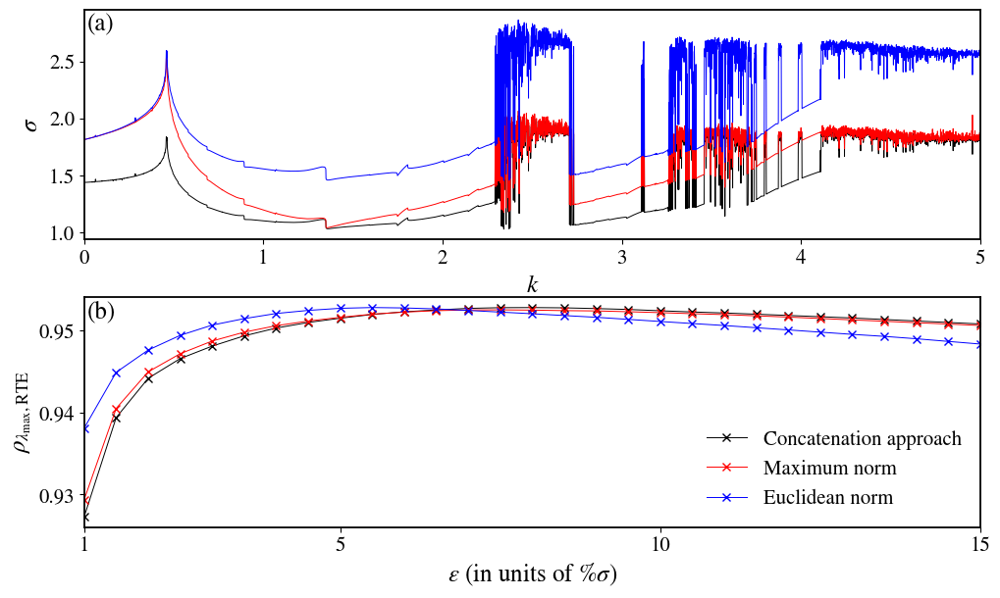

In [48]:
lw = 0.7
# (x, y) position of the label box
xbox = 0.003
ybox = 0.91
bbox = {'linewidth': 0.0, 'facecolor': 'white', 'alpha': 1.0, 'pad': 1}
# Define the parameters of the plot
plot_params(fontsize=18, tick_labelsize=15, legend_fontsize=15)
# Create the axes
fig, ax = plt.subplots(2, 1, figsize=(10, 6), facecolor="w")
ax[0].plot(k, std[:, 0], "k", lw=lw)
ax[0].plot(k, std[:, 1], "r", lw=lw)
ax[0].plot(k, std[:, 2], "b", lw=lw)
ax[0].set_xlabel("$k$")
ax[0].set_ylabel("$\\sigma$")
ax[0].set_xlim(k.min(), k.max())
ax[0].text(xbox, ybox, '(a)', transform=ax[0].transAxes, bbox=bbox)
ax[0].set_yticks([1, 1.5, 2, 2.5])

ax[1].plot(teps*100, cc1, "kx-", lw=lw, label="Concatenation approach")
ax[1].plot(teps*100, cc2, "rx-", lw=lw, label="Maximum norm")
ax[1].plot(teps*100, cc3, "bx-", lw=lw, label="Euclidean norm")
ax[1].set_xlabel("$\\epsilon$ (in units of %$\\sigma$)"), ax[1].set_ylabel("$\\rho_{\\lambda_{\\mathrm{max}}, \\mathrm{RTE}}$")
ax[1].set_xlim((teps*100).min(), (teps*100).max())
ax[1].set_xticks([1, 5, 10, 15])
ax[1].text(xbox, ybox, '(b)', transform=ax[1].transAxes, bbox=bbox)
ax[1].legend(loc="lower right", frameon=False)
# Adjust the plot
print('Adjusting the plot...')
plt.subplots_adjust(left=0.072, bottom=0.10, right=0.985, top=0.98, hspace=0.25)
# Save the figure in path
plt.savefig("Figures/rte_vs_eps.png", dpi=500, format="png")